<a href="https://colab.research.google.com/github/himanshudixit/new_article/blob/development/Question_Notebook_News_Article_Categorization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Natural Language Processing: News Article Categorization Classification

## Problem Statement

### Context

A prominent news company faces significant challenges in categorizing and organizing its vast array
of articles, with inconsistencies in tagging and classification leading to inefficiencies in content
management and reduced reader engagement. To address this, the company's management seeks
to develop a model to accurately classify articles based on headlines and content, optimize content
organization, personalize news recommendations, and enhance search functionality, aiming to
improve content discovery and enhance reader satisfaction and loyalty.

### Objective

Build a model to categorize the news articles based on the headlines, description, and the content.
The data of the articles is provided from 5 categories - sports, technology, education, business and
entertainment.

### Data Dictionary

Each of the dataset contains the following columns:

1.  Headlines : The headline of the articl
2. Description : A brief description of the article’s content
3. Content : The article’s content
4. URL : The URL of the article
5. Category : The category of the article. Categories - Sports, Business, Technology, Education
and Entertainment.
nment.
You are provided with 5 datasets for each of the categories.

## Importing necessary libraries

In [ ]:
# '''
!pip3 install matplotlib seaborn scikit-learn
!pip3 install unidecode
!pip3 install nltk
!pip3 install wordcloud
!pip3 install pandas
!pip3 install contractions
!pip3 install bs4
# '''

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 13.5 MB/s eta 0:00:00


In [ ]:
# Importing the required the libraries

# To read and manipulate the data
import pandas as pd
pd.set_option('max_colwidth', None)

import numpy as np

# To visualise the graphs
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Helps to display the images
from PIL import Image

# Helps to extract the data using regular expressions
import re

# Helps to remove the punctuation
import string

# It helps to remove the accented characters
!pip install unidecode
import unidecode

import re, string, unicodedata                          # Import Regex, string and unicodedata.
import contractions                                     # Import contractions library.
from bs4 import BeautifulSoup                           # Import BeautifulSoup.

# Importing the NLTK library
import nltk

nltk.download('stopwords')    # Loading the stopwords
nltk.download('punkt')        # Loading the punkt module, used in Tokenization
nltk.download('omw-1.4')      # Dependency for Tokenization
nltk.download('wordnet')      # Loading the wordnet module, used in stemming and lemmatization

# downloading vader lexicon
nltk.download('vader_lexicon')

from nltk.corpus import stopwords

# Helps to visualize the wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Used in Stemming
from nltk.stem.porter import PorterStemmer


from nltk.corpus import stopwords                       # Import stopwords.
from nltk.tokenize import word_tokenize, sent_tokenize  # Import Tokenizer.
from nltk.stem.wordnet import WordNetLemmatizer         # Import Lemmatizer.

from sklearn.feature_extraction.text import CountVectorizer          #For Bag of words
from sklearn.feature_extraction.text import TfidfVectorizer          #For TF-IDF

# Helped to create train and test data
from sklearn.model_selection import train_test_split

# Importing the Random Forest model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Metrics to evaluate the model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Unsupervised learning models

# Install vader sentiment package
!pip3 install vaderSentiment

# Install textblob package
!pip3 install textblob

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.4 MB/s eta 0:00:00


## Loading the dataset

In [ ]:
# Mount Google drive to access the dataset only if you are using Google Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# read the data
# Loading data into pandas dataframe
path = "/content/drive/MyDrive/Colab Notebooks/capstone/"

business_data = pd.read_csv(path + "business_data.csv")
sports_data = pd.read_csv(path + "sports_data.csv")
education_data = pd.read_csv(path + "education_data.csv")
technology_data = pd.read_csv(path + "technology_data.csv")
entertainment_data = pd.read_csv(path + "entertainment_data.csv")

## Data Overview

The initial steps to get an overview of any dataset is to:
- Observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
- Get information about the number of rows and columns in the dataset
- Find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.

In [ ]:
# View the first and last 5 rows of the dataset
business_data.head(5)

headlines  \
0             Nirmala Sitharaman to equal Morarji Desai’s record with her sixth straight budget   
1      ‘Will densify network, want to be at least no. 2 in any city pair’: Air India Express MD   
2                     Air India group to induct an aircraft every six days throughout this year   
3                      Red Sea woes: Exporters seek increased credit as freight rates jump 300%   
4  Air India group to induct a plane every 6 days throughout 2024; kick off legacy fleet revamp   

                                                                                                                                                                                                                                 description  \
0  With the presentation of the interim budget on February 1, Nirmala Sitharaman will surpass the records of her predecessors like Manmohan Singh, Arun Jaitley, P Chidambaram, and Yashwant Sinha, who had presented five budgets in a row.   
1                                          'In terms of market share, we aim to double it by 2028 in both segments—15 per cent in the domestic and 20 per cent in short-haul international,' says AI Express’s Managing Director Aloke Singh   
2    Air India currently has 117 operational aircraft in its fleet, while its arm Air India Express has 63 planes. Under the new owners, Air India has been able to bring back to service 90 per cent of its long-grounded aircraft as well.   
3                                                                                                                                                                                Rising attacks forced shippers to consider the longer route   
4                                                                                            Apart from fleet expansion, 2024 will also see Air India kick off the full interior refit of 40 legacy wide-body aircraft—Boeing 777s and 787s.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

From above brief view of business data, we can see it has **5 columns - Headlines, Description, Content, URL, Category**.
There are unwanted text like **\nADVERTISEMENT\n** in them which needs to be removed. Text has special characters, punctuations, numbers, capital, small letters, etc.,

In [ ]:
sports_data.head(5)

headlines  \
0      Jannik Sinner’s strong and improved baseline game helps him stun Novak Djokovic to reach Australian Open final   
1  Allan Border opens up about Parkinson’s disease: ‘I’m not scared, but I am worried about the slow decline process’   
2      Australian Open 2024: Jannik Sinner stops Novak Djokovic’s bid to win 11th Australian Open and 25th Grand Slam   
3                                     ‘It looked like a dead lbw’: Ben Duckett on Shubman Gill surviving a close call   
4                  In crunch time, Kiran George produces an aggressive finish to beat China’s World No.19 Lu Guang Zu   

                                                                                                                                                                                                   description  \
0             Baseline strategy has been central to Jannik Sinner's game and he has been working on it with his new coaching team since the start of 2022 – led by Darren Cahill, Andre Agassi’s former coach.   
1                                                                                           Former Australia captain says the disease has softened him a bit, which is embarrassing and good at the same time.   
2                                                                                                                         Sinner defeated Djokovic 6-1, 6-2, 6-7, 6-3 in the semfinals of the Australian Open.   
3                                                                                           Duckett believes England are still in the game and they can take wickets in cluster to put India on the back foot.   
4  As Kiran George had missed out on opportunities to go deeper into draws, his coaches at the Prakash Padukone academy in Bangalore had been drilling into him the importance of a strong, aggressive finish.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

From above brief view of sports data, we can see it has **5 columns - Headlines, Description, Content, URL, Category**.
There are unwanted text like **\nADVERTISEMENT\n** in them which needs to be removed. Also, we can see some **tags in description** for some data like **#MakeYourMovie** which has link to twitter andinformation about their tweets. Text has special characters, punctuations, numbers, capital, small letters, etc.,

In [ ]:
education_data.head(5)

,headlines,description,content,url,category
0,"CUET PG 2024: Register with NTA to enable admission to PG courses, UGC tells universities",CUET PG 2024: UGC said that the list of participating institutions displayed on the NTA website is dynamic and will be updated to include the name of the new universities after they are registered.,"The Common University Entrance Test Postgraduate (CUET PG) registration is underway and the University Grants Commission (UGC), in a notification issued on January 25, has asked universities to register with the NTA to enable admissions to PG courses in the university.\nReiterating that the National Testing Agency (NTA) has been entrusted with the responsibility to conduct CUET PG as an entrance test for admission to central universities, the commission said that the list of participating institutions displayed on the NTA website is dynamic and will be updated to include the name of the new universities after they are registered.\n“In case, you have not yet registered with NTA for enabling admissions to PG courses in your university in the year 2024, you may do so now,” the UGC said.\nRead | CUET PG 2024: New test centres added at Gurugram, Srinagar\nNTA will close the CUET PG 2024 application window on January 31. Candidates yet to register for CUET PG 2024 can apply online at the new website – pgcuet.samarth.ac.in.\n“The list of participating institutions as displayed on NTA’s website is dynamic and will be updated to include the name of your university after you register with NTA, it added.\nThe commission has also shared help desk numbers to get queries and clarifications cleared. It is 011-40759000. The universities intending to participate in CUET PG can also email at cuet-pg@nta.ac.in to resolve queries.",https://indianexpress.com/article/education/cuet-pg-2024-register-with-nta-to-enable-admission-to-pg-courses-ugc-tells-universities-9129159/,education
1,Oxford ends ties with TCS iON over technical glitches,"On April 10, 2023 TCS had announced that it had been selected by Oxford University for the delivery of most of the university’s admissions tests from 2023 onwards.","Less than a year after the Oxford University signed a contract with the Tata Consultancy Services (TCS) iON to oversee the Oxford admissions test, the varsity has decided to terminate its deal with the company.\n“Following the technical problems experienced by some candidates undertaking Oxford’s online admissions tests in 2023, as well as their schools, colleges and other test centres, we have undertaken a detailed review of the issues to understand better how and why these occurred and taken on board the expert and valuable feedback shared. Our Pro-Vice-Chancellor for Education, Professor Martin Williams has recently written to all test centres to communicate our decision to end our relationship with Tata Consultancy Services (TCS),” an official statement from the UK-based varsity stated.\nThe pro vice chancellor assured all affiliated schools and colleges that the varsity will do “utmost to streamline the process and ensure that the burden on teachers and exams officers is minimised as far as practically possible,” he said in a letter addressed to all affiliated teachers and exams officers.\nRead | Indians in top colleges | ‘Oxford University is an experience of lifelong learning’\nOn April 10, 2023 TCS had announced that it had been selected by Oxford University for the delivery of most of the university’s admissions tests from 2023 onwards.\nHowever, in October several candidates took to ‘X’ (formerly known as Twitter) to complain about technical glitches during their admission tests. Candidates reported frozen screens, server crashes and more.\nWe look forward to a written apology and statement about the progress of the tests today. Not only with technical errors, but also the error on the ELAT. Students have prepared for these for months, so rapid response is necessary to assure them they will not be disadvantaged.

From above brief view of education data, we can see it has **5 columns - Headlines, Description, Content, URL, Category**.
There are unwanted text like **\nADVERTISEMENT\n** in them which needs to be removed. Also, education data has **lot of abbreviations like NEET, PG, UG, MSc** which can be expanded. Text has special characters, punctuations, numbers, capital, small letters, etc.,

In [ ]:
entertainment_data.head(5)

,headlines,description,content,url,category
0,"Bhumi Pednekar plays an investigative journalist in Netflix’s Bhakshak, film to premiere on this date","Bhumi Pednekar plays an investigative journalist in Bhakshak, trying to bring to light a heinous crime, laying bare the ground reality of crimes against women.","Actor Bhumi Pednekar is all set to take over the screen with her impactful performance once again. The Bheed actor will soon be seen headlining Netflix’s investigative drama Bhakshak. The film, backed by Shah Rukh Khan and Gauri Khan’s Red Chillies Entertainment, is scheduled to premiere on the OTT platform on February 9.\nBhumi took to social media on Thursday to share the film’s teaser. Taking to Instagram, she wrote, “The story of one journalist who would stop at nothing to uncover the truth. #Bhakshak inspired by true events coming on 9th February, only on Netflix.”\n View this post on Instagram\n A post shared by Netflix India (@netflix_in)\nNetflix, in a press release, shared that the film is inspired by true events. In the teaser, we see Bhumi as Vaishali Singh, a fierce investigative journalist, on the quest to bring to light a heinous crime, laying bare the ground reality of crimes against women. On the intense topic of the film, the director said in a statement, “Our aim was to shed light on the harsh realities of society and spark conversations that lead to meaningful change. I’m looking forward to more people joining this important dialogue.”\nAlso read | Bhumi Pednekar admits she’s made to feel like ‘number two’ in films with male co-stars\nExpressing his thoughts on the film’s release, Gaurav Verma, Producer at Red Chillies Entertainment, says, “We believe in storytelling that not only entertains but also enlightens. This film is a testament to our commitment to narratives that provoke thought and inspire societal reflections. We’re excited to collaborate with Netflix to share this impactful story with audiences worldwide.”\nADVERTISEMENT\nNetflix India’s Ruchikaa Kapoor Sheikh adds, “Bhakshak, is a hard-hitting story, inspired by true events. The film follows a determined journalist who strives to bring justice against all odds.”\nBhakshak is directed by Pulkit and produced by Gauri Khan and Gaurav Verma. Along with Bhumi, Sanjay Mishra, Aditya Srivastava and Sai Tamhankar also play pivotal roles in the film. It will release on Netflix on February 9.\nClick for more updates and latest Bollywood news along with Entertainment updates. Also get latest news and top headlines from India and around the world at The Indian Express.",https://indianexpress.com/article/entertainment/bollywood/bhumi-pednekar-plays-an-investigative-journalist-in-netflixs-bhakshak-film-to-premiere-on-this-date-9115188/,entertainment
1,Karan Johar channels his inner Rajinikanth in new advertisement: ‘The actor within me is so impressed’,"Karan Johar and Kiara Advani featured in a new advertisement for an eyewear brand, which gave Karan an opportunity to flex his acting chops.","Karan Johar reunited with his Lust Stories star Kiara Advani in a new series of advertisements for an eyewear brand. After one commercial in which Kiara play-acted as Karan, going around asking people if they’re dating, a new spot shows Karan channeling his inner Rajinikanth. In the ad, Karan and Kiara are both dressed like a quintessential Rajinikanth character, wearing shirts, vests, and aviator sunglasses.\nKaran seems to be having the time of his life delivering the broad performance. One of the most recognisable filmmakers of the country, Karan made a full-fledged acting debut with Anurag Kashyap’s ill-fated 2015 gangster drama Bombay Velvet. He has since joked multiple times about how the movie’s critical and commercial failure killed his acting ambitions. In the new ad, Karan adopts ‘the south Indian superstar look’, and immediately transforms into a dialogue-delivering, scenery chewing showboat.\nAlso read – After Dharma creative head’s criticism of Vidh

From above brief view of entertainment data, we can see it has **5 columns - Headlines, Description, Content, URL, Category**.
There are unwanted text like **\nADVERTISEMENT\n** in them which needs to be removed. And with entertainment data we have **lot of Names (Person, Object, Movies, etc.,)** which can be uniquely used to identify a person. Text has special characters, punctuations, numbers, capital, small letters, etc.,

In [ ]:
technology_data.head(5)

headlines  \
0         Unlocking the science of E Ink displays: Why we believe they must catch on   
1              Reddit is free education: 9 subreddits that can be your best teachers   
2  Nintendo Switching things up? Leaks suggest larger 8″ screen for next-gen console   
3       Epic’s Fortnite and new browser engines show cracks in Apple’s walled garden   
4                 Hubble finds water vapour on small exoplanet in landmark discovery   

                                                                                                                                                                            description  \
0                                                                            That e-reader screen isn't magic - it's E Ink! We break down the science behind these paper-like displays.   
1                                            These subreddits bring the best of the Internet. From infographics to educational GIFs, these groups can be your go-to space for learning.   
2                                                                                       Rumour has it the upcoming Nintendo Switch 2 will be equipped with a sizable 8-inch LCD screen.   
3                                                              The EU's antitrust regulations are forcing Apple to open iOS to competition like Fortnite and alternate browser engines.   
4  Scientists have used the Hubble Space Telescope to discover the presence of water on a distant exoplanet. This makes GJ 9827d the smallest exoplanet where we have discovered water.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

From above brief view of technology data, we can see it has **5 columns - Headlines, Description, Content, URL, Category**.
There are unwanted text like **\nADVERTISEMENT\n** in them which needs to be removed. Here, it includes **both Abbreviations, Names (Company, Technology), etc.,**. Text has special characters, punctuations, numbers, capital, small letters, etc.,

From above snapshot of all the data, we can see there are lot of different categories in text, small letters, capital letters, punctutations, numbers, special characters. There are few repetitive words like **\nADVERTISEMENT\n** which needs to removed as well.


In [ ]:
# Understand the shape of the dataset
print("Business Data:"+str(business_data.shape))
print("Education Data:"+str(education_data.shape))
print("Entertainment Data:"+str(entertainment_data.shape))
print("Sports Data:"+str(sports_data.shape))
print("Technology Data:"+str(technology_data.shape))


Business Data:(2000, 5)
Education Data:(2000, 5)
Entertainment Data:(2000, 5)
Sports Data:(2000, 5)
Technology Data:(2000, 5)


There are total **2000 examples for each category with 5 features**. Total we have **10000 examples as training data with 5 features**. Since one feature is our target, so ideally its **10000 examples with 4 features**.

## Variable data Types of each dataset

In [ ]:
# Check the data types of the columns for the dataset
print("Business Data")
print(business_data.info())
print("Education Data")
print(education_data.info())
print("Entertainment Data")
print(entertainment_data.info())
print("Sports Data")
print(sports_data.info())
print("Technology Data")
print(technology_data.info())

Business Data
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   headlines    2000 non-null   object
 1   description  2000 non-null   object
 2   content      2000 non-null   object
 3   url          2000 non-null   object
 4   category     2000 non-null   object
dtypes: object(5)
memory usage: 78.2+ KB
None
Education Data
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   headlines    2000 non-null   object
 1   description  2000 non-null   object
 2   content      2000 non-null   object
 3   url          2000 non-null   object
 4   category     2000 non-null   object
dtypes: object(5)
memory usage: 78.2+ KB
None
Entertainment Data
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999


From above information of all the dataset, we can see all of them has 5 features.
1. headlines
2. description
3. content
4. url
5. category

All features are of **object data type and non-null.**

## Description of dataset

In [ ]:
business_data.describe(include="all").T

count unique  \
headlines    2000   2000   
description  2000   1996   
content      2000   2000   
url          2000   2000   
category     2000      1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

We can see almost all features are unique except for **description** in Business Data.


"Global stocks were mixed Friday, as the tech sell-off on Wall Street sent jitters through the market while investors prepared for key central banks to announce their latest policy decisions next week."
--> **Occured twice in the data.**

In [ ]:
education_data.describe(include="all").T

,count,unique,top,freq
headlines,2000,1988,"Students furious about ‘normalisation’ process after CUET UG 2023 result, say ‘is this a luck-based exam?’",2
description,2000,1987,"As universities begin the admission process, students complain about the normalisation process, and demand for 'more fair analysis'.",2
content,2000,1996,"(‘My dear students’, a fortnightly column that is a conversation with young minds on current events, books, popular culture — just about anything that’s worth talking over a cup of coffee.)\nMy dear students,\nYou need a subscription to read this archive article.\nBUY NOW\nAlready a subscriber? Sign in",3
url,2000,1990,https://indianexpress.com/article/education/is-this-a-luck-based-exam-students-furious-about-normalisation-process-after-cuet-ug-2023-result-8845353/,2
category,2000,1,education,2000


There are **some repeating values in all features of education data but its very very less.**

In [ ]:
entertainment_data.describe(include="all").T

,count,unique,top,freq
headlines,2000,2000,"Bhumi Pednekar plays an investigative journalist in Netflix’s Bhakshak, film to premiere on this date",1
description,2000,2000,"Bhumi Pednekar plays an investigative journalist in Bhakshak, trying to bring to light a heinous crime, laying bare the ground reality of crimes against women.",1
content,2000,2000,"Actor Bhumi Pednekar is all set to take over the screen with her impactful performance once again. The Bheed actor will soon be seen headlining Netflix’s investigative drama Bhakshak. The film, backed by Shah Rukh Khan and Gauri Khan’s Red Chillies Entertainment, is scheduled to premiere on the OTT platform on February 9.\nBhumi took to social media on Thursday to share the film’s teaser. Taking to Instagram, she wrote, “The story of one journalist who would stop at nothing to uncover the truth. #Bhakshak inspired by true events coming on 9th February, only on Netflix.”\n View this post on Instagram\n A post shared by Netflix India (@netflix_in)\nNetflix, in a press release, shared that the film is inspired by true events. In the teaser, we see Bhumi as Vaishali Singh, a fierce investigative journalist, on the quest to bring to light a heinous crime, laying bare the ground reality of crimes against women. On the intense topic of the film, the director said in a statement, “Our aim was to shed light on the harsh realities of society and spark conversations that lead to meaningful change. I’m looking forward to more people joining this important dialogue.”\nAlso read | Bhumi Pednekar admits she’s made to feel like ‘number two’ in films with male co-stars\nExpressing his thoughts on the film’s release, Gaurav Verma, Producer at Red Chillies Entertainment, says, “We believe in storytelling that not only entertains but also enlightens. This film is a testament to our commitment to narratives that provoke thought and inspire societal reflections. We’re excited to collaborate with Netflix to share this impactful story with audiences worldwide.”\nADVERTISEMENT\nNetflix India’s Ruchikaa Kapoor Sheikh adds, “Bhakshak, is a hard-hitting story, inspired by true events. The film follows a determined journalist who strives to bring justice against all odds.”\nBhakshak is directed by Pulkit and produced by Gauri Khan and Gaurav Verma. Along with Bhumi, Sanjay Mishra, Aditya Srivastava and Sai Tamhankar also play pivotal roles in the film. It will release on Netflix on February 9.\nClick for more updates and latest Bollywood news along with Entertainment updates. Also get latest news and top headlines from India and around the world at The Indian Express.",1
url,2000,2000,https://indianexpress.com/article/entertainment/bollywood/bhumi-pednekar-plays-an-investigative-journalist-in-netflixs-bhakshak-film-to-premiere-on-this-date-9115188/,1
category,2000,1,entertainment,2000


**All data points are unique in entertainment data.**

In [ ]:
sports_data.describe(include="all").T

,count,unique,top,freq
headlines,2000,2000,Jannik Sinner’s strong and improved baseline game helps him stun Novak Djokovic to reach Australian Open final,1
description,2000,1997,India on Sunday won their maiden ICC title in women's cricket as a bunch of sprightly and talented teenagers lifted the inaugural U-19 World Cup with an emphatic seven-wicket victory over England.,2
content,2000,1995,"Grand Slam fever grips tennis fans all over the world as the 2023 Australian Open kicks off. For the next fortnight, The Indian Express will bring you the biggest storylines of the day, and the best matches to watch at timings suitable for Indian audiences, every morning.",6
url,2000,2000,https://indianexpress.com/article/sports/tennis/jannik-sinners-strong-and-improved-baseline-game-helps-him-stun-novak-djokovic-to-reach-australian-open-final-9129073/,1
category,2000,1,sports,2000


Some **data points (description, content) in sports_data are repeated but very very less frequency (<7)**

In [ ]:
technology_data.describe(include="all").T

count unique  \
headlines    2000   2000   
description  2000   1998   
content      2000   2000   
url          2000   2000   
category     2000      1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

**Description feature is repeated but with very less frequency (<3) in technology data**

## Dataset Inference Conclusion

Below are the brief summary of the Dataset inference:
1. There are total **5 categories of the data - Business, Sports, Education, Entertainment & Technology.**
2. **Each category of dataset has total 2000 examples with 5 features/columns/variables.**
3. **Total dataset size is 10000 examples.**
4. From above brief view of all the categories of data, we can see it has **5 columns/features/variables - Headlines, Description, Content, URL, Category**.
5. All the columns are of **object data-type and non-null**.
6. All of them are **text data**.
7. Our **target column is category** which needs to be classified.
8. There are **unwanted text like \nADVERTISEMENT\n** in them which are repeated and needs to be removed.
9. Text has special characters, punctuations, numbers, capital, small letters, etc.,
10. Text also has Abbreviations, Names (Person, Object, Movie, Technology, Place, etc.,)
11. From brief overview of url, we can find identify category and sub-category of every article. For e.g. https://indianexpress.com/article/technology/science/hubble-exoplanet-water-9128948/    --> **Category** - Technology, **Sub-Category** - Science
12. From descriptive statistics of the data, we find **some values are repeated in some columns**, but repeatative **frequency is very less (< 7).**
13. Business Data - **Description** column has repeatations.
14. Entertainment Data - **All Columns are unique**.
15. Sports Data - **Description & Content** columns have repeatations.
16. Technology Data - **Description** column has repeatations.
17. Education Data - **All Columns has repeatations.**

## Exploratory Data Analysis

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.


**Questions**:

- What is the percentage of text for each label
- How does a wordcloud appear for  Business category?
- How does a wordcloud appear for  Education category?
- How does a wordcloud appear for  Entertainment category?
- How does a wordcloud appear for  Sports category?
- How does a wordcloud appear for  Technology category ?
- What are insights observed from EDA?

In [ ]:
# Combine all the data into single data
# do vertical concat
news_data = pd.concat([business_data, education_data, entertainment_data, sports_data, technology_data], axis=0)
news_data = news_data.reset_index(drop=True)

In [ ]:
# Print few lines of news_data
news_data.head()

headlines  \
0             Nirmala Sitharaman to equal Morarji Desai’s record with her sixth straight budget   
1      ‘Will densify network, want to be at least no. 2 in any city pair’: Air India Express MD   
2                     Air India group to induct an aircraft every six days throughout this year   
3                      Red Sea woes: Exporters seek increased credit as freight rates jump 300%   
4  Air India group to induct a plane every 6 days throughout 2024; kick off legacy fleet revamp   

                                                                                                                                                                                                                                 description  \
0  With the presentation of the interim budget on February 1, Nirmala Sitharaman will surpass the records of her predecessors like Manmohan Singh, Arun Jaitley, P Chidambaram, and Yashwant Sinha, who had presented five budgets in a row.   
1                                          'In terms of market share, we aim to double it by 2028 in both segments—15 per cent in the domestic and 20 per cent in short-haul international,' says AI Express’s Managing Director Aloke Singh   
2    Air India currently has 117 operational aircraft in its fleet, while its arm Air India Express has 63 planes. Under the new owners, Air India has been able to bring back to service 90 per cent of its long-grounded aircraft as well.   
3                                                                                                                                                                                Rising attacks forced shippers to consider the longer route   
4                                                                                            Apart from fleet expansion, 2024 will also see Air India kick off the full interior refit of 40 legacy wide-body aircraft—Boeing 777s and 787s.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [ ]:
#Print few lines of news data
news_data.tail()

,headlines,description,content,url,category
9995,Vivaldi’s privacy and customisability-focused browser is now available on iOS,The Vivaldi browser is now available on iOS and brings many of its customisability and privacy-focused features to Apple devices,"Vivaldi, the free browser founded by Opera co-founder Jon Stephenson von Tetzchner, is now available on iOS. The privacy and customisability-focused browser comes to Apple devices more than six years after the desktop version was launched. The company had already launched a stable version of the browser for Android devices in 2020.\nVivaldi on iOS has a distinctive look and feel compared to other browsers and comes with some of its signature built-in tools like Speed Dials, Panels, Notes, a Reading List, and a Tracker and Ad Blocker. If you already use Vivaldi on other devices, you will be able to sync your browsing data with your iOS device.\nYou have exhausted your monthly limit of free stories.\nRegister to read more stories\nContinue With:-\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in",https://indianexpress.com/article/technology/tech-news-technology/vivaldi-browser-ios-launch-8959816/,technology
9996,"From Meta Quest 3 to Ray Ban Smart Glasses, here’s everything announced at Connect 2023","The future is here. Meta unveils its next-gen AR headset and a pair of smart glasses, alongside the Meta AI chatbot.","Meta has concluded its Connect 2023 event, unveiling its next-generation mixed-reality headset, the Meta Quest 3, and a pair of smart glasses. In addition to these announcements, Meta had several updates related to AI. Let’s delve into the key revelations from the event.\nMeta Quest 3\nThe Quest 3 offers improved comfort for glasses wearers. (Image: Meta)\nThe highly anticipated Meta Quest 3, teased in June just before Apple’s Vision Pro reveal, has now been unveiled in all its glory. This mixed reality headset boasts a full-colour passthrough and seamlessly integrates augmented reality elements into your surroundings. Powered by Qualcomm’s Snapdragon XR2 Gen 2 chip, it promises double the performance of its predecessor, the Quest 2. Expect crisper visuals and an expanded depth of field, all while maintaining a 90Hz refresh rate.\nYou have exhausted your monthly limit of free stories.\nRegister to read more stories\nContinue With:-\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in",https://indianexpress.com/article/technology/tech-news-technology/meta-connect-2023-everything-announced-8959802/,technology
9997,Samsung Galaxy S24 rumoured to launch on January 18,Samsung might shift the launch window of its upcoming Galaxy S24 series from end of February to mid-January. The new phones are expected to be powered Exynos 2400 or Snapdragon 8 Gen 3 for Galaxy chipsets.,"Samsung has been launching its Galaxy S series flagships in the first quarter of every year for more than a decade now. However, new rumours suggest the South Korean phone manufacturer might launch the upcoming Galaxy S24 series earlier this year on January 18.\nThe news comes from the known tipster Ice Universe, who shared a post on the Chinese social media platform Weibo claiming that the Galaxy S24 will be coming early next year. The tipster adds that it might not be the accurate date, but the company would most likely make the announcement in mid-January.\nYou have exhausted your monthly limit of free stories.\nRegister to read more stories\nContinue With:-\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in",https://indianexpress.com/article/technology/mobile-tabs/samsung-galaxy-s24-rumoured-to-launch-on-january-18-8959567/,technology
9998,"‘We continuously iterate… building prototypes, testing, and refining the design until we get it right: Dyson’s Josh Mutlow","Dyson's success in floorcare tech lies in innovation, user-friendly design, smart home integration, and a focus on sustainability and durability.","“When things don’t go as planned, we return to the drawing board, c

### What is the percentage of text for each label ?

In [ ]:
# check the count of each labels
news_data['category'].value_counts(normalize=True) * 100

category
business         20.0
education        20.0
entertainment    20.0
sports           20.0
technology       20.0
Name: proportion, dtype: float64

We can see data is **equal proportion for all the categories**

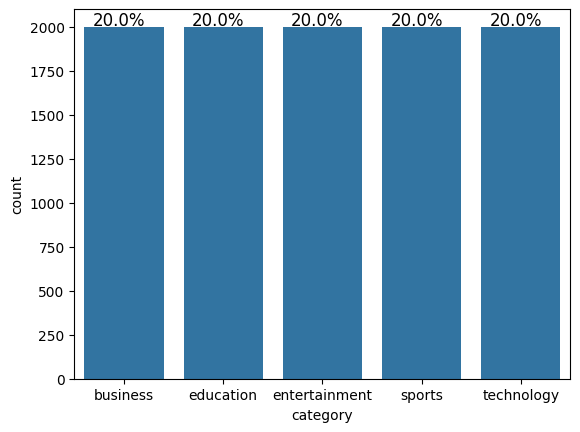

In [ ]:
# Plot the distribution of the class label
def bar_plot(data, feature):
    # Creating the countplot
    plot = sns.countplot(x = feature, data = data)

    # Finding the length the whole data
    total = len(data)

    # Creating the percentages to each label in the data
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        plot.annotate(percentage, (x, y),ha="center",
            va = "center",
            size = 12,
            xytext = (0, 5),
            textcoords = "offset points")
    plt.show()

bar_plot(news_data,'category')

From above barplot we can see :

1. **All categories are of equal distribution of 20%.**

## Univariate Analysis

### How does Sub-categories look like for each Category ?

From **url we can identify that there are some sub-categories in each category**.
For e.g.
1. https://indianexpress.com/article/technology/artificial-intelligence/chatgpt-users-can-now-browse-internet-openai-says-8959541/  --> Category - Technology, Sub-Category - artificial-intelligence
2. https://indianexpress.com/article/business/aviation/interview-with-aloke-singh-md-air-india-express-9128164/ --> Category - Business, Sub-Category - Aviation
3. https://indianexpress.com/article/entertainment/bollywood/bhumi-pednekar-plays-an-investigative-journalist-in-netflixs-bhakshak-film-to-premiere-on-this-date-9115188/	 --> Category - Entertainment, Sub-Category - Bollywood
4. https://indianexpress.com/article/sports/tennis/jannik-sinners-strong-and-improved-baseline-game-helps-him-stun-novak-djokovic-to-reach-australian-open-final-9129073/ --> Category - Sports, Sub-Category - Tennis

To extract the sub-categories from each category url information, we will follow below step-by-step approach:
1. Split the url based on character "/".
   e.g. [https:, , indianexpress.com, article, business, budget, finance-minister-nirmala-sitharaman-equal-morarji-desai-record-interim-budget-2024-9128868, ]
3. Get the length of the splitted array.
4. If length is equal to 8, that means sub-category is present. For e.g.
   https: -> 1
   
   NULL_VALUE -> 2

   
   indianexpress.com -> 3

   
   article -> 4

   
   business -> 5

   
   budget -> 6

   
   finance-minister-nirmala-sitharaman-equal-morarji-desai-record-interim-budget-2024-9128868 -> 7
   
   NULL_VALUE -> 8
6. If its equal to 8, extract those cases and get the 5th index value (index starts from 0) to get the sub-categories.
7. Count them to get to know the percentage.

   Business_Sub_Category  count  percentage
0                economy    384       19.20
1              companies    361       18.05
2                 market    337       16.85
3    banking-and-finance    166        8.30
4               aviation    107        5.35
5            commodities     52        2.60
6     sponsored-business     19        0.95
7               startups     14        0.70
8           world-market     12        0.60
9                 budget      4        0.20
10                Others    544       27.20


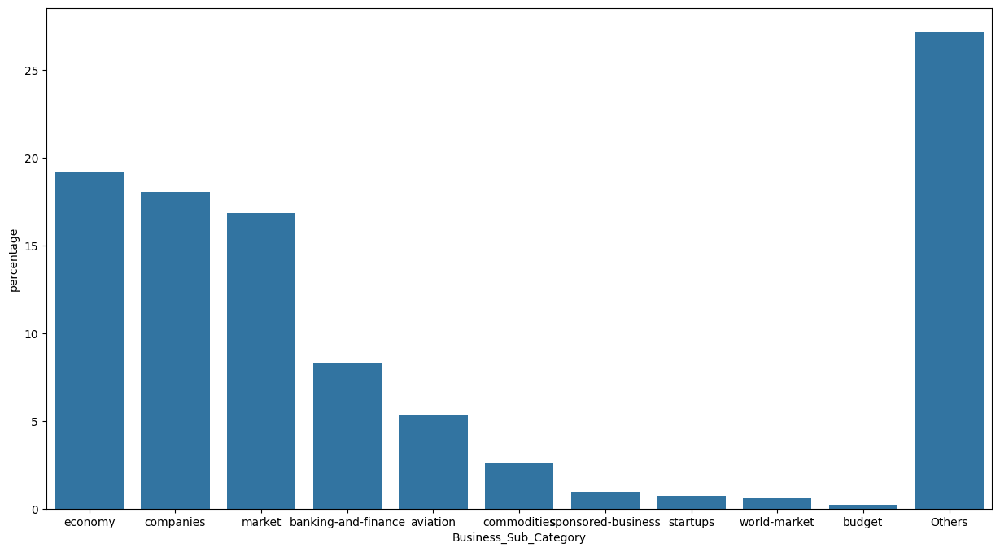

In [ ]:
## Extract the sub-categories from Business data

# Split based on /
values=business_data['url'].str.split('/')

# Get the samples which have splitted string count of 8
mask = (business_data['url'].str.split('/').str.len() == 8)

#Extract the sub-category and count them
business_data_subcategory=pd.DataFrame(business_data.loc[mask].url.str.split('/').str[5].value_counts())#, columns=["sub-category","count"])
business_data_subcategory.reset_index(inplace=True)
business_data_subcategory.rename(columns = {'url':'Business_Sub_Category'}, inplace = True)
# Get Others values and percentage for each subcategory
business_data_subcategory.loc[len(business_data_subcategory.index)] = (["Others",len(business_data) - business_data_subcategory['count'].sum()])
business_data_subcategory["percentage"]=business_data_subcategory['count'].div(len(business_data))*100
print(business_data_subcategory)

# Plot the bar plot for each subcateory
plt.figure(figsize=(15,8))
ax = sns.barplot(business_data_subcategory, x="Business_Sub_Category", y="percentage")




   Sports_Sub_Category  count  percentage
0              cricket   1111       55.55
1             football    466       23.30
2               tennis    134        6.70
3         sport-others    101        5.05
4            badminton     60        3.00
5               hockey     39        1.95
6                chess     16        0.80
7                 golf     14        0.70
8           basketball     14        0.70
9          motor-sport     10        0.50
10              Others     35        1.75


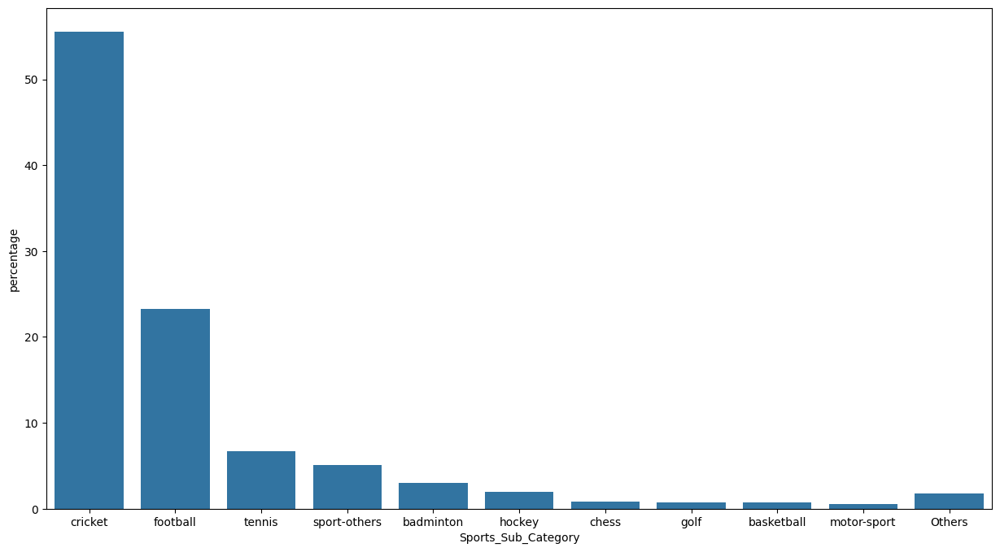

In [ ]:
## Extract the sub-categories from Sports data

# Split based on /
values=sports_data['url'].str.split('/')

# Get the samples which have splitted string count of 8
mask = (sports_data['url'].str.split('/').str.len() == 8)

#Extract the sub-category and count them
sports_data_subcategory=pd.DataFrame(sports_data.loc[mask].url.str.split('/').str[5].value_counts()) #, columns=["sub-category","count"])
sports_data_subcategory.reset_index(inplace=True)
sports_data_subcategory.rename(columns = {'url':'Sports_Sub_Category'}, inplace = True)

# Get Others values and percentage for each subcategory
sports_data_subcategory.loc[len(sports_data_subcategory.index)] = (["Others",len(sports_data) - sports_data_subcategory['count'].sum()])
sports_data_subcategory["percentage"]=sports_data_subcategory['count'].div(len(sports_data))*100
#sports_
print(sports_data_subcategory)

# Plot the bar plot for each subcateory
plt.figure(figsize=(15,8))
ax = sns.barplot(sports_data_subcategory, x="Sports_Sub_Category", y="percentage")



  Education_Sub_Category  count  percentage
0           study-abroad    151        7.55
1    sponsored-education     42        2.10
2                 Others   1807       90.35


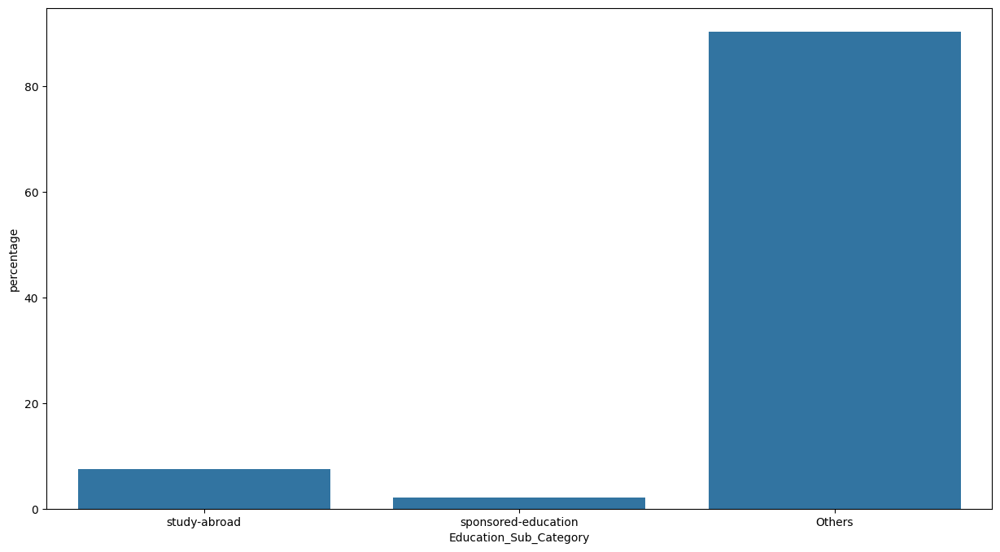

In [ ]:
## Extract the sub-categories from Education data

# Split based on /
values=education_data['url'].str.split('/')

# Get the samples which have splitted string count of 8
mask = (education_data['url'].str.split('/').str.len() == 8)

#Extract the sub-category and count them
education_data_subcategory=pd.DataFrame(education_data.loc[mask].url.str.split('/').str[5].value_counts()) #, columns=["sub-category","count"])
education_data_subcategory.reset_index(inplace=True)
education_data_subcategory.rename(columns = {'url':'Education_Sub_Category'}, inplace = True)
# Get Others values and percentage for each subcategory
education_data_subcategory.loc[len(education_data_subcategory.index)] = (["Others",len(education_data) - education_data_subcategory['count'].sum()])

education_data_subcategory["percentage"]=education_data_subcategory['count'].div(len(education_data))*100
print(education_data_subcategory)

# Plot the bar plot for each subcateory
plt.figure(figsize=(15,8))
ax = sns.barplot(education_data_subcategory, x="Education_Sub_Category", y="percentage")


   Entertainment_Sub_Category  count  percentage
0                   bollywood   1304       65.20
1                       tamil    159        7.95
2                      telugu    133        6.65
3                  television    119        5.95
4                   hollywood     62        3.10
5                movie-review     57        2.85
6                   malayalam     56        2.80
7                  web-series     33        1.65
8                       music     31        1.55
9        entertainment-others     16        0.80
10                   regional     15        0.75
11      opinion-entertainment      4        0.20
12                     Others     11        0.55


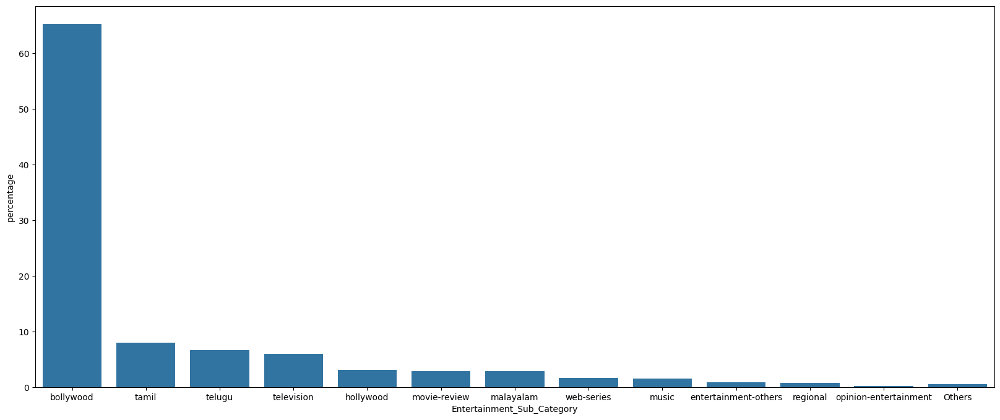

In [ ]:
## Extract the sub-categories from Entertainment data

# Split based on /
values=entertainment_data['url'].str.split('/')

# Get the samples which have splitted string count of 8
mask = (entertainment_data['url'].str.split('/').str.len() == 8)

#Extract the sub-category and count them
entertainment_data_subcategory=pd.DataFrame(entertainment_data.loc[mask].url.str.split('/').str[5].value_counts()) #, columns=["sub-category","count"])
entertainment_data_subcategory.reset_index(inplace=True)
entertainment_data_subcategory.rename(columns = {'url':'Entertainment_Sub_Category'}, inplace = True)
# Get Others values and percentage for each subcategory
entertainment_data_subcategory.loc[len(entertainment_data_subcategory.index)] = (["Others",len(entertainment_data) - entertainment_data_subcategory['count'].sum()])
entertainment_data_subcategory["percentage"]=entertainment_data_subcategory['count'].div(len(entertainment_data))*100
print(entertainment_data_subcategory)

# Plot the bar plot for each subcateory
plt.figure(figsize=(20,8))
ax = sns.barplot(entertainment_data_subcategory, x="Entertainment_Sub_Category", y="percentage")


     Technology_Sub_Category  count  percentage
0       tech-news-technology    895       44.75
1    artificial-intelligence    305       15.25
2                    science    302       15.10
3                    techook    120        6.00
4               tech-reviews     80        4.00
5                mobile-tabs     69        3.45
6                     gaming     68        3.40
7                     social     36        1.80
8                    laptops     11        0.55
9                    gadgets      8        0.40
10                 sponsored      2        0.10
11        opinion-technology      2        0.10
12                    crypto      1        0.05
13  brand-partner-technology      1        0.05
14                    Others    100        5.00


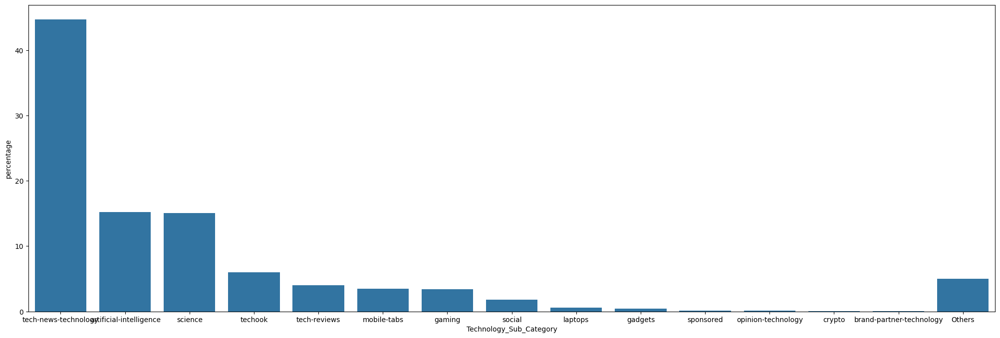

In [ ]:
## Extract the sub-categories from Technology data

# Split based on /
values=technology_data['url'].str.split('/')

# Get the samples which have splitted string count of 8
mask = (technology_data['url'].str.split('/').str.len() == 8)

#Extract the sub-category and count them
technology_data_subcategory=pd.DataFrame(technology_data.loc[mask].url.str.split('/').str[5].value_counts()) #, columns=["sub-category","count"])
technology_data_subcategory.reset_index(inplace=True)
technology_data_subcategory.rename(columns = {'url':'Technology_Sub_Category'}, inplace = True)

# Get Others values and percentage for each subcategory
technology_data_subcategory.loc[len(technology_data_subcategory.index)] = (["Others",len(technology_data) - technology_data_subcategory['count'].sum()])
technology_data_subcategory["percentage"]=technology_data_subcategory['count'].div(len(technology_data))*100
print(technology_data_subcategory)

# Plot the bar plot for each subcateory
plt.figure(figsize=(25,8))
ax = sns.barplot(technology_data_subcategory, x="Technology_Sub_Category", y="percentage")


## Word Cloud for each feature of each Category



```
# This is formatted as code
```

### How does a wordcloud appear for Business category?

In [ ]:
# Creating word cloud for Business category

business_category = news_data[news_data['category'] == "business"]

content_words = ' '.join(business_category['content'])
headlines_words = ' '.join(business_category['headlines'])
description_words = ' '.join(business_category['description'])
url_words = ' '.join(business_category['url'])

cleaned_content_word = " ".join([word for word in content_words.split()])
cleaned_headlines_word = " ".join([word for word in headlines_words.split()])
cleaned_description_word = " ".join([word for word in description_words.split()])
cleaned_url_word = " ".join([word for word in url_words.split()])


In [ ]:
content_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_content_word)
headlines_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_headlines_word)
description_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_description_word)
url_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_url_word)

Text(0.5, 1.0, 'Business URL')

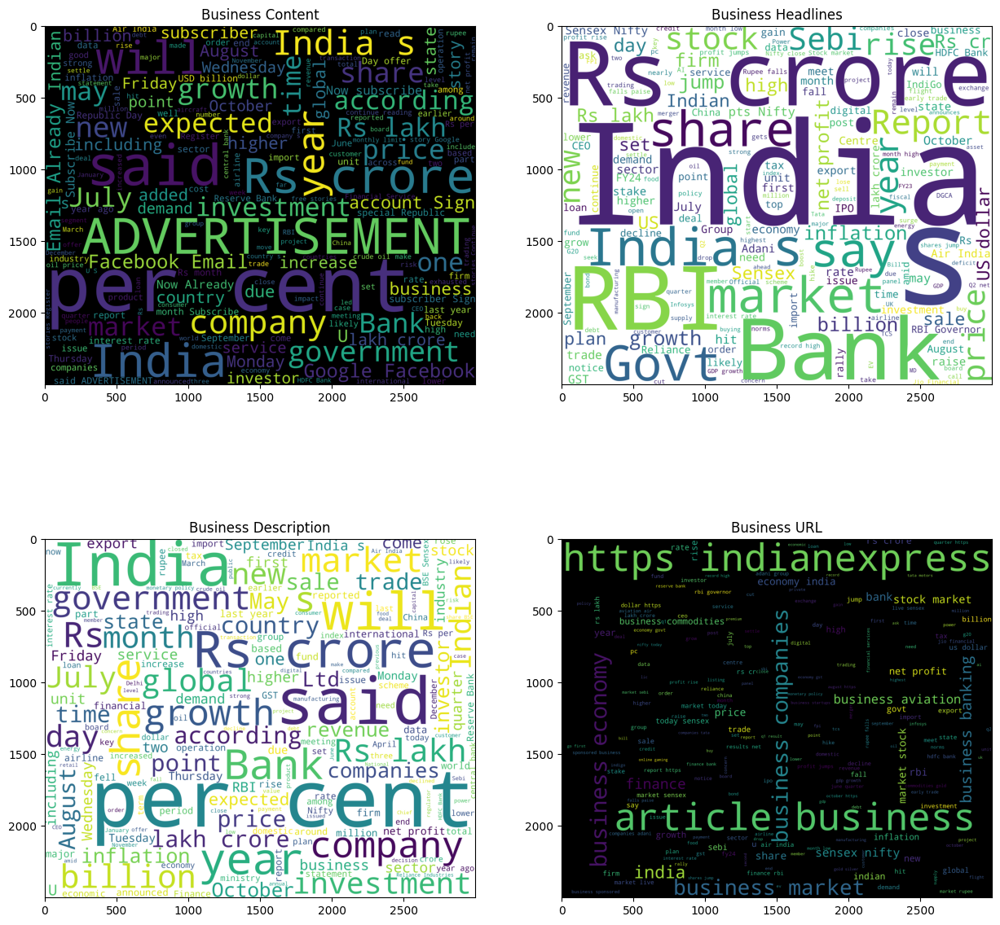

In [ ]:

fig, axs = plt.subplots(2, 2, figsize=(15,15))
axs[0, 0].imshow(content_wordcloud)
axs[0, 0].set_title('Business Content')
axs[0, 1].imshow(headlines_wordcloud)
axs[0, 1].set_title('Business Headlines')
axs[1, 0].imshow(description_wordcloud)
axs[1, 0].set_title('Business Description')
axs[1, 1].imshow(url_wordcloud)
axs[1, 1].set_title('Business URL')



### How does a wordcloud appear for Education category?

In [ ]:
# Creating word cloud for Education category
education_category = news_data[news_data['category'] == "education"]

content_words = ' '.join(education_category['content'])
headlines_words = ' '.join(education_category['headlines'])
description_words = ' '.join(education_category['description'])
url_words = ' '.join(education_category['url'])


cleaned_content_word = " ".join([word for word in content_words.split()])
cleaned_headlines_word = " ".join([word for word in headlines_words.split()])
cleaned_description_word = " ".join([word for word in description_words.split()])
cleaned_url_word = " ".join([word for word in url_words.split()])


In [ ]:
content_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_content_word)
headlines_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_headlines_word)
description_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_description_word)
url_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_url_word)

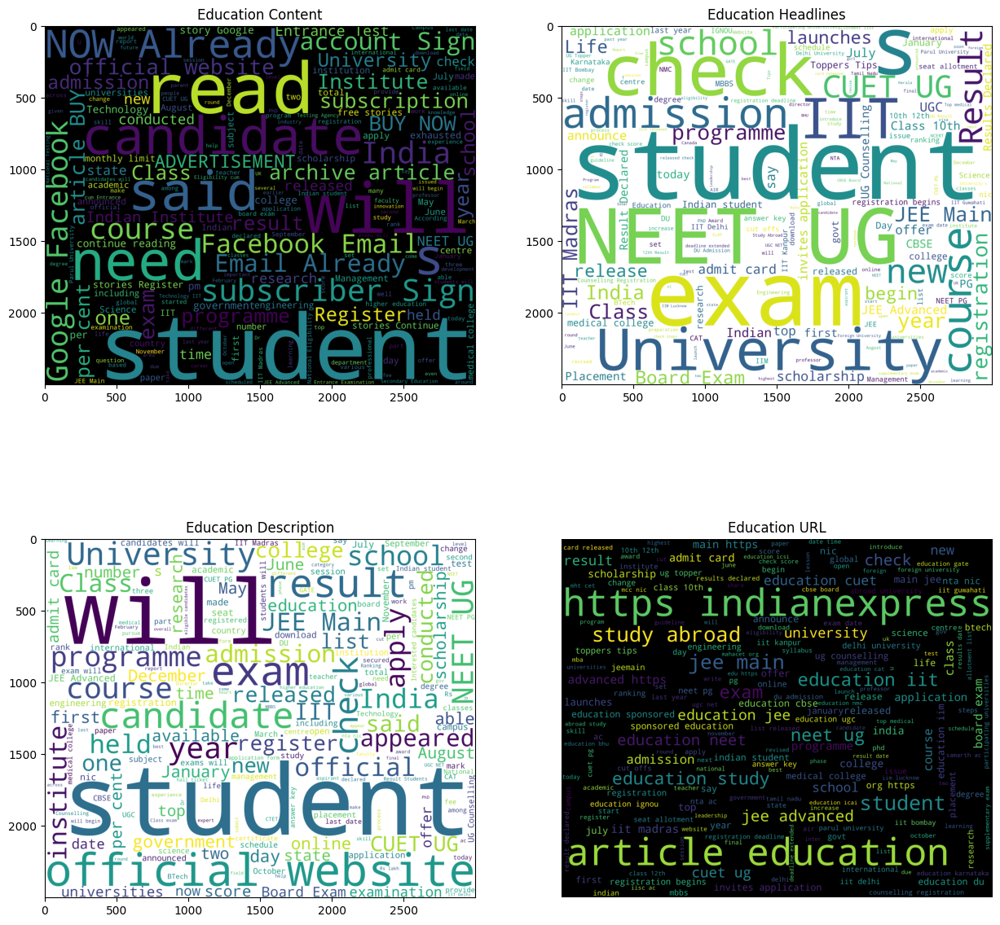

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15,15))
axs[0, 0].imshow(content_wordcloud)
axs[0, 0].set_title('Education Content')
axs[0, 1].imshow(headlines_wordcloud)
axs[0, 1].set_title('Education Headlines')
axs[1, 0].imshow(description_wordcloud)
axs[1, 0].set_title('Education Description')
axs[1, 1].imshow(url_wordcloud)
axs[1, 1].set_title('Education URL')


plt.axis('off')

plt.show()

### How does a wordcloud appear for Entertainment category?

In [ ]:
# Creating word cloud for Entertainment category

entertainment_category = news_data[news_data['category'] == "entertainment"]

content_words = ' '.join(entertainment_category['content'])
headlines_words = ' '.join(entertainment_category['headlines'])
description_words = ' '.join(entertainment_category['description'])
url_words = ' '.join(entertainment_category['url'])

cleaned_content_word = " ".join([word for word in content_words.split()])
cleaned_headlines_word = " ".join([word for word in headlines_words.split()])
cleaned_description_word = " ".join([word for word in description_words.split()])
cleaned_url_word = " ".join([word for word in url_words.split()])

In [ ]:
content_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_content_word)
headlines_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_headlines_word)
description_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_description_word)
url_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_url_word)

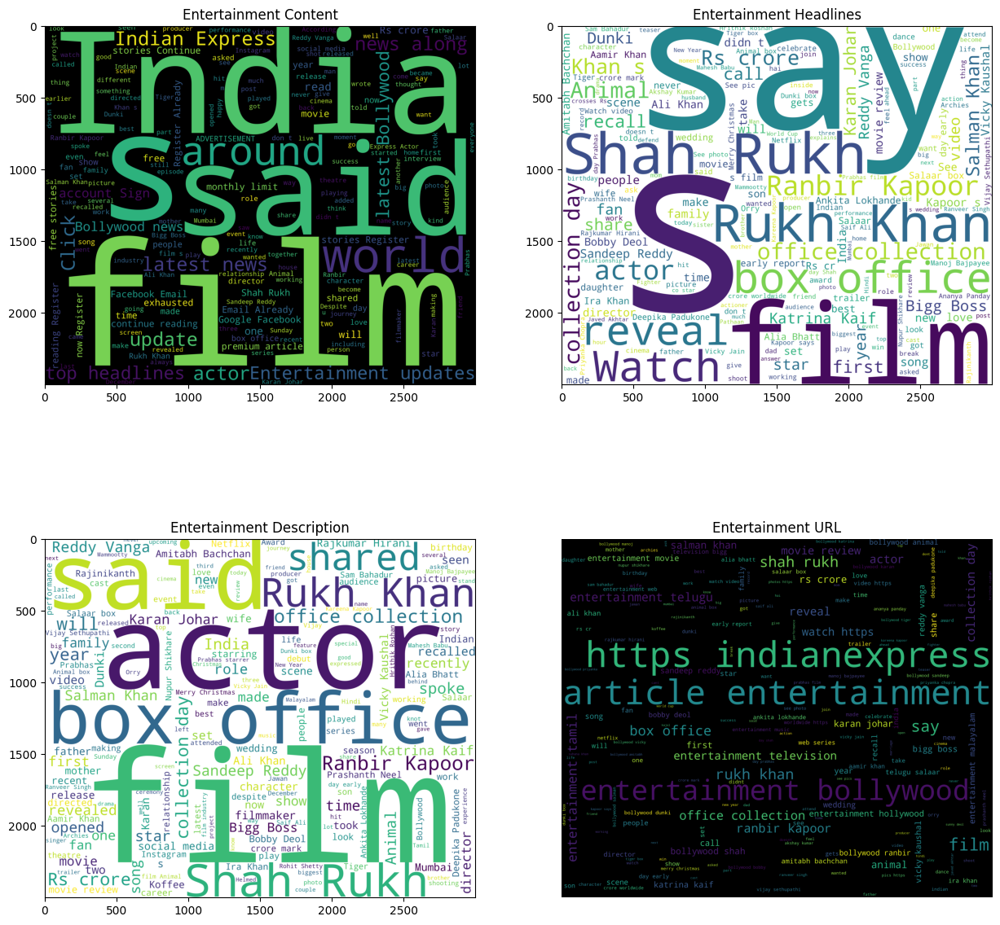

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15,15))
axs[0, 0].imshow(content_wordcloud)
axs[0, 0].set_title('Entertainment Content')
axs[0, 1].imshow(headlines_wordcloud)
axs[0, 1].set_title('Entertainment Headlines')
axs[1, 0].imshow(description_wordcloud)
axs[1, 0].set_title('Entertainment Description')
axs[1, 1].imshow(url_wordcloud)
axs[1, 1].set_title('Entertainment URL')


plt.axis('off')

plt.show()

### How does a wordcloud appear for Sports category?

In [ ]:
# Creating word cloud for Sports category

sports_category = news_data[news_data['category'] == "sports"]

content_words = ' '.join(sports_category['content'])
headlines_words = ' '.join(sports_category['headlines'])
description_words = ' '.join(sports_category['description'])
url_words = ' '.join(sports_category['url'])


cleaned_content_word = " ".join([word for word in content_words.split()])
cleaned_headlines_word = " ".join([word for word in headlines_words.split()])
cleaned_description_word = " ".join([word for word in description_words.split()])
cleaned_url_word = " ".join([word for word in url_words.split()])


In [ ]:
content_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_content_word)
headlines_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_headlines_word)
description_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_description_word)
url_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_url_word)

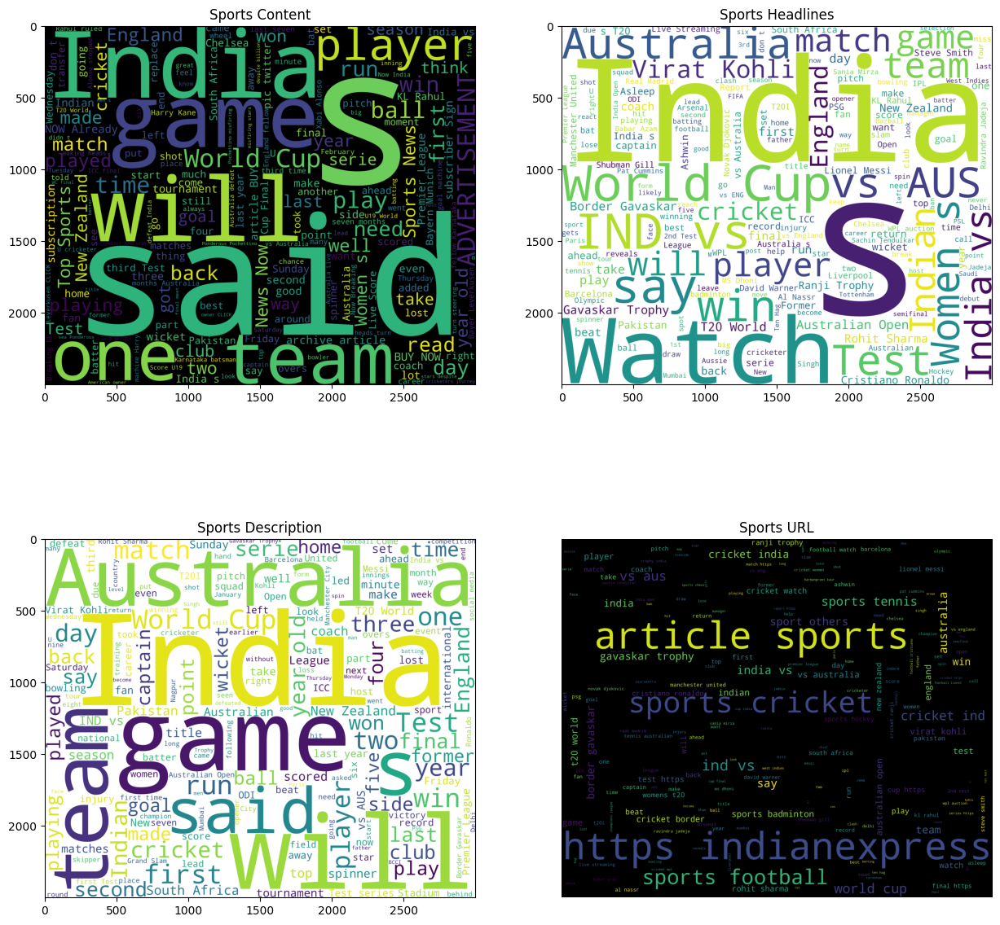

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15,15))
axs[0, 0].imshow(content_wordcloud)
axs[0, 0].set_title('Sports Content')
axs[0, 1].imshow(headlines_wordcloud)
axs[0, 1].set_title('Sports Headlines')
axs[1, 0].imshow(description_wordcloud)
axs[1, 0].set_title('Sports Description')
axs[1, 1].imshow(url_wordcloud)
axs[1, 1].set_title('Sports URL')


plt.axis('off')

plt.show()

### How does a wordcloud appear for Technology category?

In [ ]:
# Creating word cloud for Technology category

technology_category = news_data[news_data['category'] == "technology"]

content_words = ' '.join(technology_category['content'])
headlines_words = ' '.join(technology_category['headlines'])
description_words = ' '.join(technology_category['description'])
url_words = ' '.join(technology_category['url'])


cleaned_content_word = " ".join([word for word in content_words.split()])
cleaned_headlines_word = " ".join([word for word in headlines_words.split()])
cleaned_description_word = " ".join([word for word in description_words.split()])
cleaned_url_word = " ".join([word for word in url_words.split()])

In [ ]:
content_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_content_word)
headlines_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_headlines_word)
description_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_description_word)
url_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_url_word)

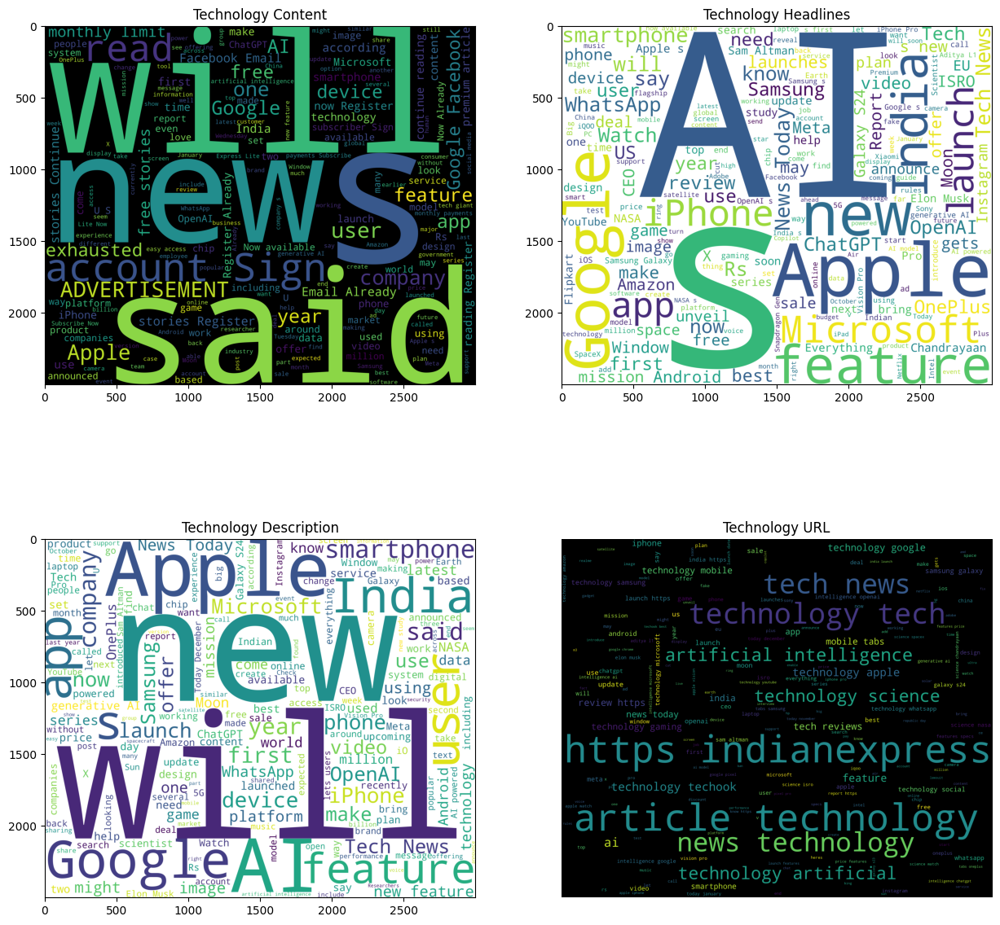

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15,15))
axs[0, 0].imshow(content_wordcloud)
axs[0, 0].set_title('Technology Content')
axs[0, 1].imshow(headlines_wordcloud)
axs[0, 1].set_title('Technology Headlines')
axs[1, 0].imshow(description_wordcloud)
axs[1, 0].set_title('Technology Description')
axs[1, 1].imshow(url_wordcloud)
axs[1, 1].set_title('Technology URL')


plt.axis('off')

plt.show()

## Text Characters Analysis for each category and feature

array([[<Axes: title={'center': 'Business Headlines'}>,
        <Axes: title={'center': 'Sports Headlines'}>],
       [<Axes: title={'center': 'Education Headlines'}>,
        <Axes: title={'center': 'Entertainment Headlines'}>],
       [<Axes: title={'center': 'Technology Headlines'}>, <Axes: >]],
      dtype=object)

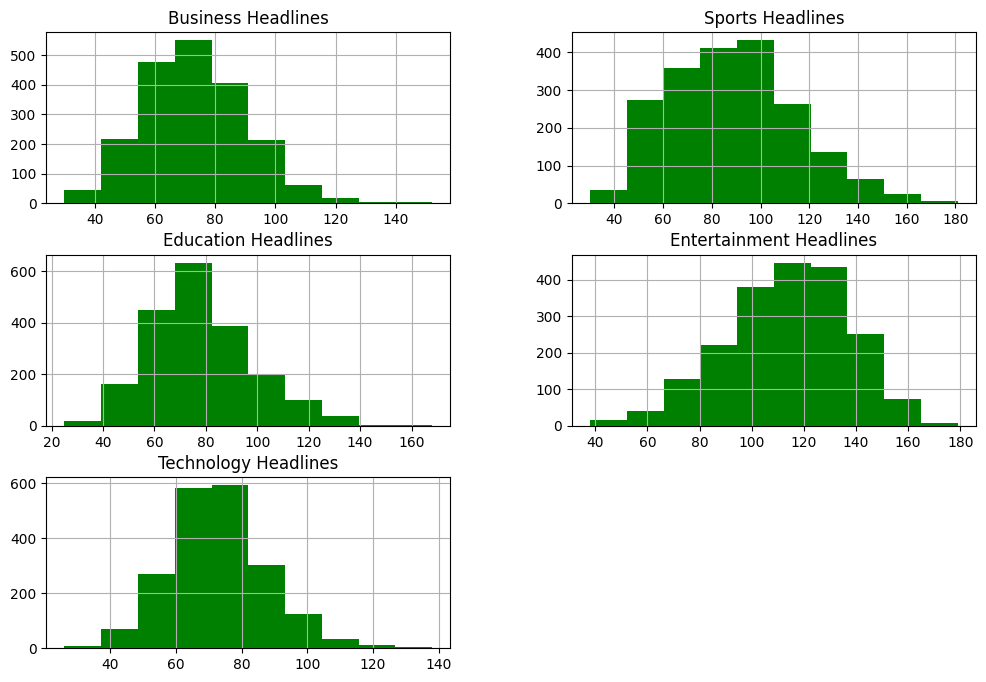

In [ ]:
# For Headlines Feature of all category
all_headlines = pd.DataFrame({ "Business Headlines":  business_data['headlines'].str.len(), "Sports Headlines":  sports_data['headlines'].str.len(),
                                "Education Headlines": education_data['headlines'].str.len(), "Entertainment Headlines": entertainment_data['headlines'].str.len(),
                                "Technology Headlines": technology_data['headlines'].str.len()})
all_headlines.hist(figsize=(12,8), color='green')



The above histogram shows that **news headlines range from 20 to 180 characters** and generally, it is
1. Between **60 to 80 characters for Business Education and Technology.**
2. Between **80 to 100 for Sports Category**
3. Between **100 to 140 for Entertainment Category**

array([[<Axes: title={'center': 'Business Content'}>,
        <Axes: title={'center': 'Sports Content'}>],
       [<Axes: title={'center': 'Education Content'}>,
        <Axes: title={'center': 'Entertainment Content'}>],
       [<Axes: title={'center': 'Technology Content'}>, <Axes: >]],
      dtype=object)

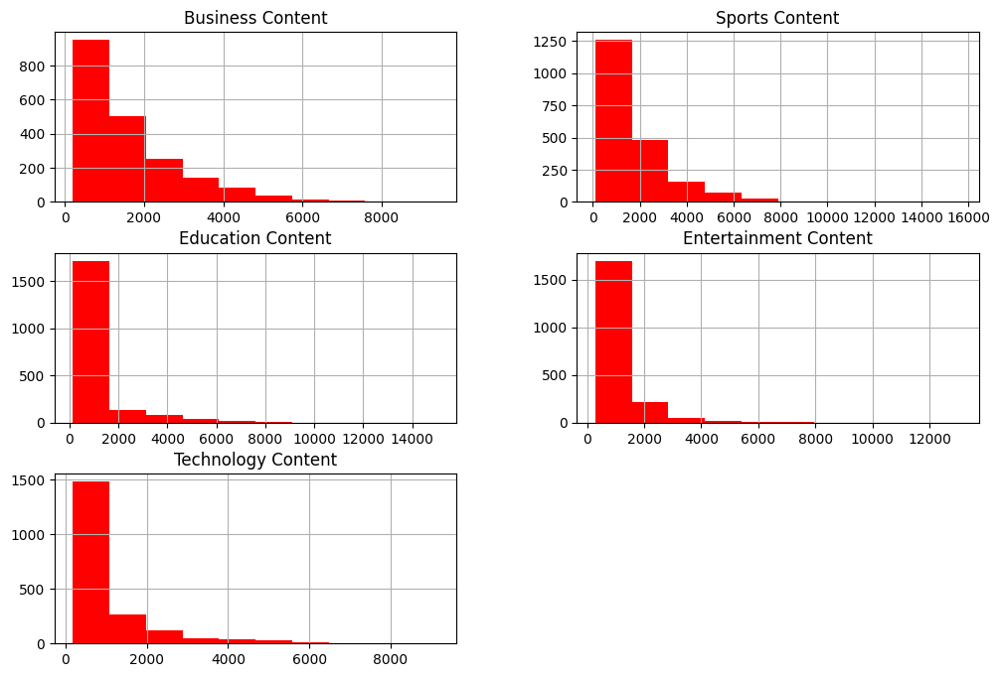

In [ ]:
# For Content Feature of all category
all_content = pd.DataFrame({ "Business Content":  business_data['content'].str.len(), "Sports Content":  sports_data['content'].str.len(),
                                "Education Content": education_data['content'].str.len(), "Entertainment Content": entertainment_data['content'].str.len(),
                                "Technology Content": technology_data['content'].str.len()})
all_content.hist(figsize=(12,8), color='red')



In [ ]:
all_content

,Business Content,Sports Content,Education Content,Entertainment Content,Technology Content
0,5.236994,4.938719,5.133047,5.146341,4.935558
1,4.889764,4.550645,5.364366,5.413194,5.126138
2,5.215311,4.794444,5.373494,4.796339,5.159609
3,5.066986,4.562025,5.181818,4.450161,5.216146
4,5.220447,4.820243,5.088235,5.094406,4.871875
...,...,...,...,...,...
1995,5.249448,4.640625,4.888889,4.808642,5.014925
1996,4.970276,4.897297,4.826389,5.029586,5.337580
1997,5.155606,5.045455,4.880952,5.179487,4.909836
1998,4.599119,4.805882,5.401961,4.884058,5.206612


The above histogram shows that **news content range from 100 to 14000 characters and generally, it is between 100 to 2000 characters.**

array([[<Axes: title={'center': 'Business Description'}>,
        <Axes: title={'center': 'Sports Description'}>],
       [<Axes: title={'center': 'Education Description'}>,
        <Axes: title={'center': 'Entertainment Description'}>],
       [<Axes: title={'center': 'Technology Description'}>, <Axes: >]],
      dtype=object)

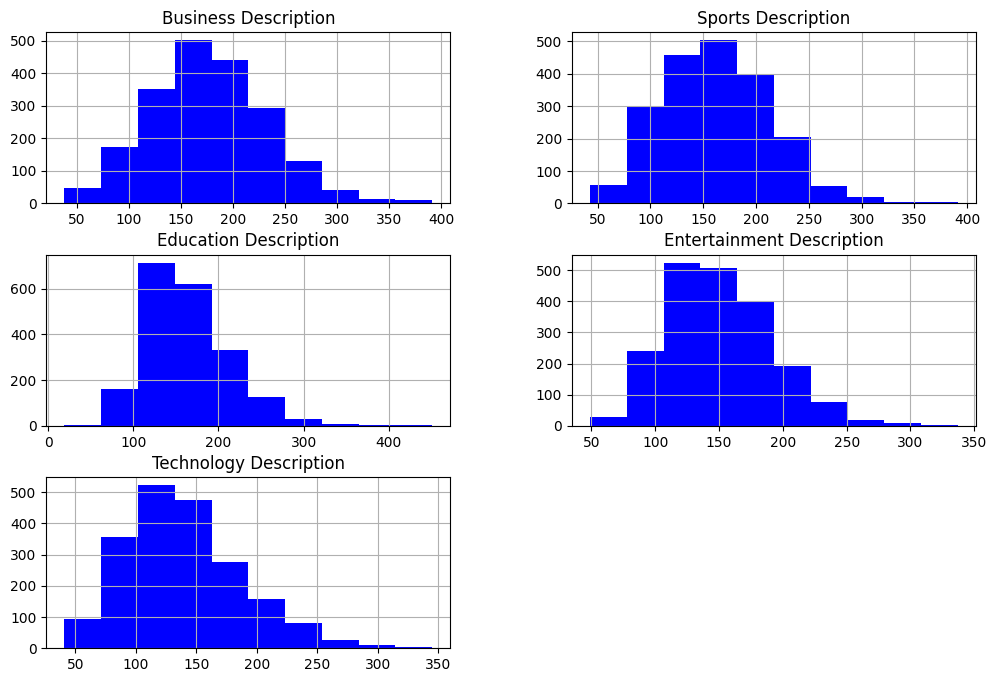

In [ ]:
# For Description Feature of all category
all_description = pd.DataFrame({ "Business Description":  business_data['description'].str.len(), "Sports Description":  sports_data['description'].str.len(),
                                "Education Description": education_data['description'].str.len(), "Entertainment Description": entertainment_data['description'].str.len(),
                                "Technology Description": technology_data['description'].str.len()})
all_description.hist(figsize=(12,8), color='Blue')



The above histogram shows that **news description range from 40 to 400 characters and generally, it is between 100 to 200 characters.**

## Word Count Analysis for each feature of each category

array([[<Axes: title={'center': 'Business Headlines'}>,
        <Axes: title={'center': 'Sports Headlines'}>],
       [<Axes: title={'center': 'Education Headlines'}>,
        <Axes: title={'center': 'Entertainment Headlines'}>],
       [<Axes: title={'center': 'Technology Headlines'}>, <Axes: >]],
      dtype=object)

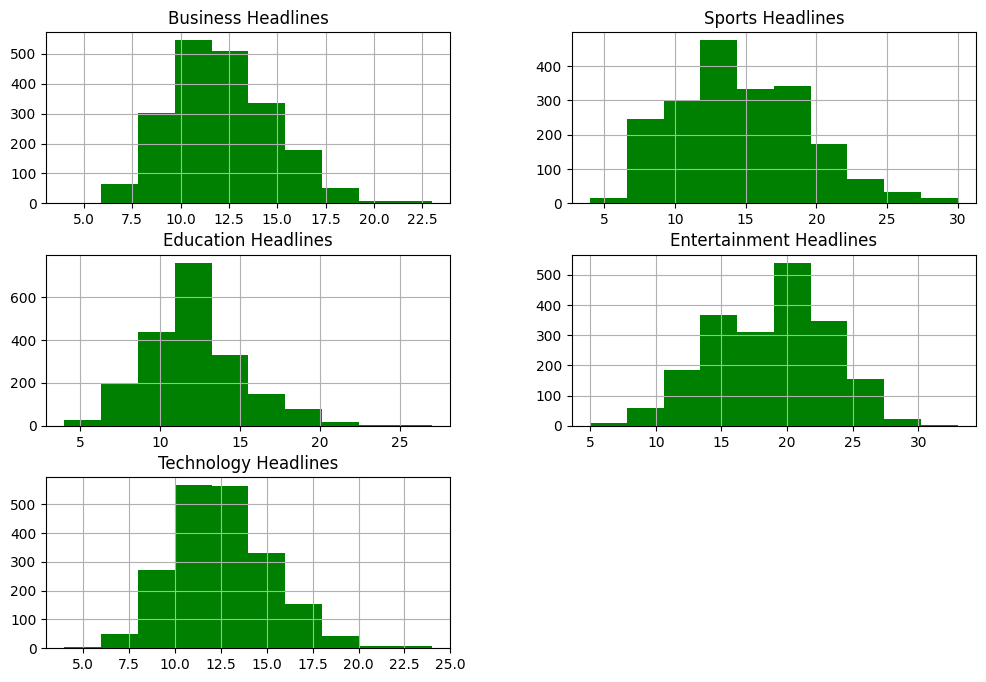

In [ ]:
# For Headlines Feature of all category
all_headlines = pd.DataFrame({ "Business Headlines":  business_data['headlines'].str.split().map(lambda x: len(x)), "Sports Headlines":  sports_data['headlines'].str.split().map(lambda x: len(x)),
                                "Education Headlines": education_data['headlines'].str.split().map(lambda x: len(x)), "Entertainment Headlines": entertainment_data['headlines'].str.split().map(lambda x: len(x)),
                                "Technology Headlines": technology_data['headlines'].str.split().map(lambda x: len(x))})
all_headlines.hist(figsize=(12,8), color='green')


#text.str.split().map(lambda x: len(x)).hist()

array([[<Axes: title={'center': 'Business Content'}>,
        <Axes: title={'center': 'Sports Content'}>],
       [<Axes: title={'center': 'Education Content'}>,
        <Axes: title={'center': 'Entertainment Content'}>],
       [<Axes: title={'center': 'Technology Content'}>, <Axes: >]],
      dtype=object)

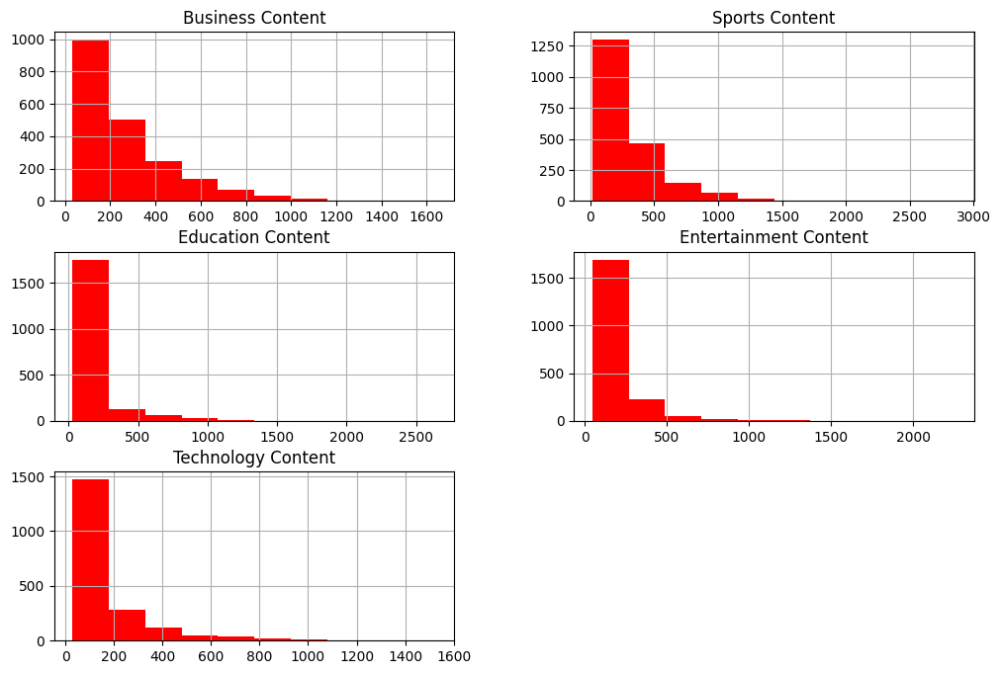

In [ ]:
# For Content Feature of all category
all_content = pd.DataFrame({ "Business Content":  business_data['content'].str.split().map(lambda x: len(x)), "Sports Content":  sports_data['content'].str.split().map(lambda x: len(x)),
                                "Education Content": education_data['content'].str.split().map(lambda x: len(x)), "Entertainment Content": entertainment_data['content'].str.split().map(lambda x: len(x)),
                                "Technology Content": technology_data['content'].str.split().map(lambda x: len(x))})
all_content.hist(figsize=(12,8), color='red')



array([[<Axes: title={'center': 'Business Description'}>,
        <Axes: title={'center': 'Sports Description'}>],
       [<Axes: title={'center': 'Education Description'}>,
        <Axes: title={'center': 'Entertainment Description'}>],
       [<Axes: title={'center': 'Technology Description'}>, <Axes: >]],
      dtype=object)

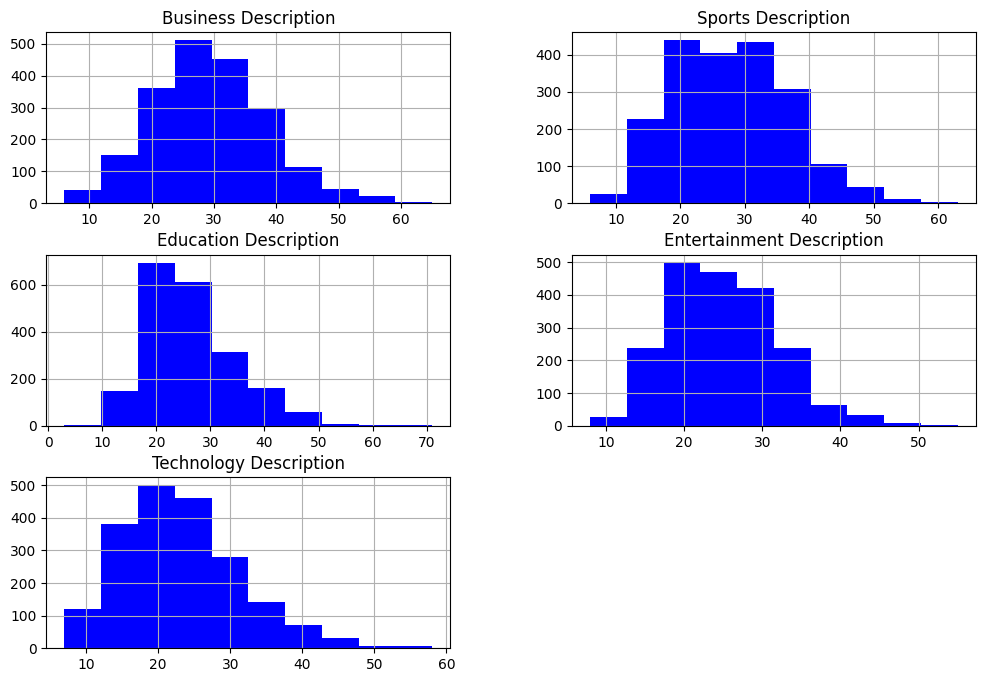

In [ ]:
# For Description Feature of all category
all_description = pd.DataFrame({ "Business Description":  business_data['description'].str.split().map(lambda x: len(x)), "Sports Description":  sports_data['description'].str.split().map(lambda x: len(x)),
                                "Education Description": education_data['description'].str.split().map(lambda x: len(x)), "Entertainment Description": entertainment_data['description'].str.split().map(lambda x: len(x)),
                                "Technology Description": technology_data['description'].str.split().map(lambda x: len(x))})
all_description.hist(figsize=(12,8), color='Blue')



## Average Word Length Analysis of each feature of each category

array([[<Axes: title={'center': 'Business Headlines'}>,
        <Axes: title={'center': 'Sports Headlines'}>],
       [<Axes: title={'center': 'Education Headlines'}>,
        <Axes: title={'center': 'Entertainment Headlines'}>],
       [<Axes: title={'center': 'Technology Headlines'}>, <Axes: >]],
      dtype=object)

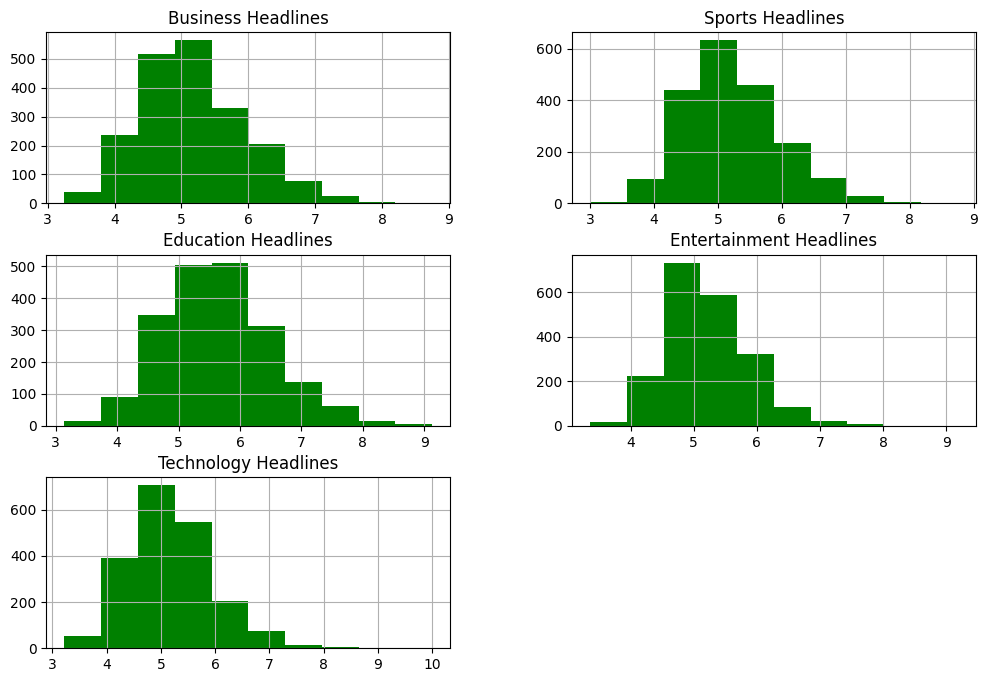

In [ ]:
# For Headlines Feature of all category
all_headlines = pd.DataFrame({ "Business Headlines":  business_data['headlines'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Sports Headlines":  sports_data['headlines'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Education Headlines": education_data['headlines'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Entertainment Headlines": entertainment_data['headlines'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Technology Headlines": technology_data['headlines'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))})
all_headlines.hist(figsize=(12,8), color='green')


#text.str.split().map(lambda x: len(x)).hist()
#apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)).hist()

From above histogram of headlines, **average word length of each category headlines is 5.**

array([[<Axes: title={'center': 'Business Content'}>,
        <Axes: title={'center': 'Sports Content'}>],
       [<Axes: title={'center': 'Education Content'}>,
        <Axes: title={'center': 'Entertainment Content'}>],
       [<Axes: title={'center': 'Technology Content'}>, <Axes: >]],
      dtype=object)

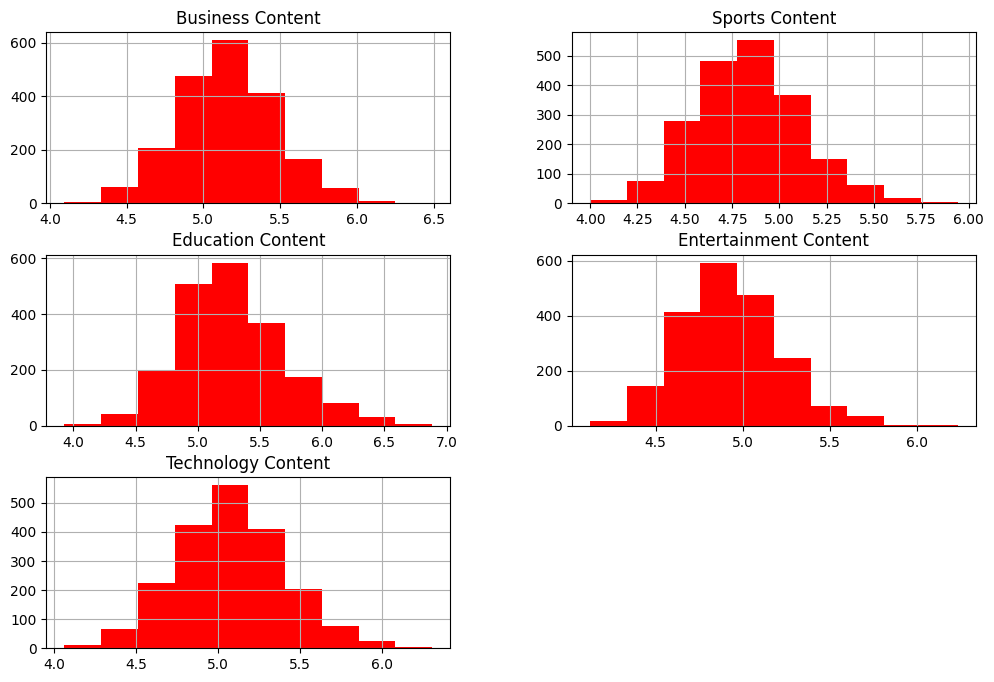

In [ ]:
# For Content Feature of all category
all_content = pd.DataFrame({ "Business Content":  business_data['content'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Sports Content":  sports_data['content'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Education Content": education_data['content'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Entertainment Content": entertainment_data['content'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Technology Content": technology_data['content'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))})
all_content.hist(figsize=(12,8), color='red')


From above histograms, we can see **average length of each word in content is around 4.5 ~ 5.5 for all categories.**

array([[<Axes: title={'center': 'Business Description'}>,
        <Axes: title={'center': 'Sports Description'}>],
       [<Axes: title={'center': 'Education Description'}>,
        <Axes: title={'center': 'Entertainment Description'}>],
       [<Axes: title={'center': 'Technology Description'}>, <Axes: >]],
      dtype=object)

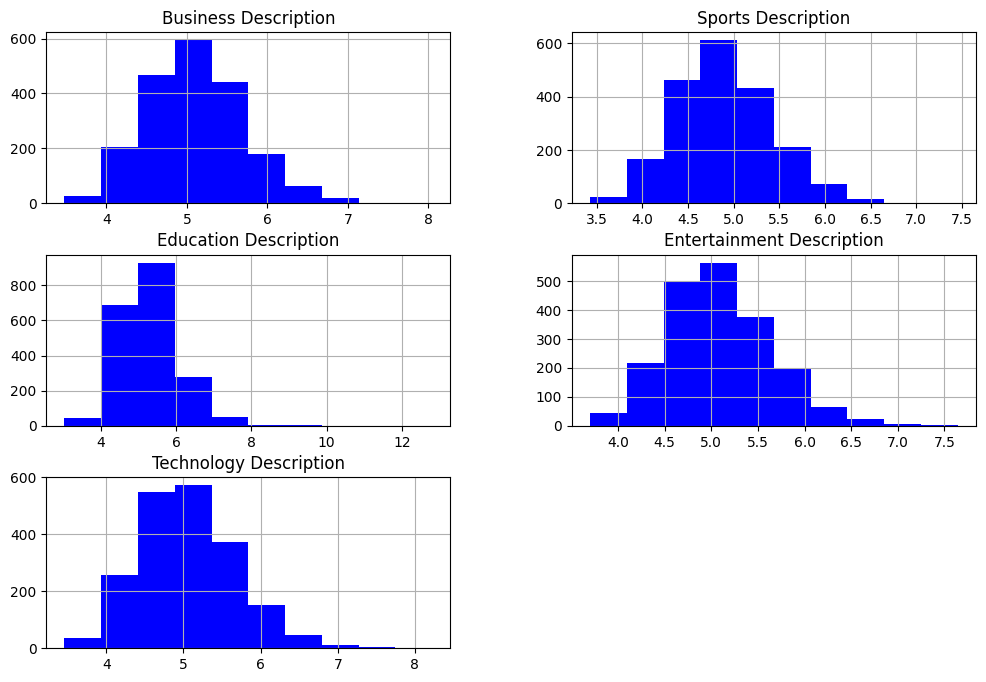

In [ ]:
# For Description Feature of all category
all_description = pd.DataFrame({ "Business Description":  business_data['description'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Sports Description":  sports_data['description'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Education Description": education_data['description'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Entertainment Description": entertainment_data['description'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Technology Description": technology_data['description'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))})
all_description.hist(figsize=(12,8), color='Blue')



From above histograms, we can see **average length of each word in description is around 4.5 ~ 5.5 for all categories.**

## Frequent Word Analysis in each feature of each Category

Text(0.5, 1.0, 'Technology Headlines')

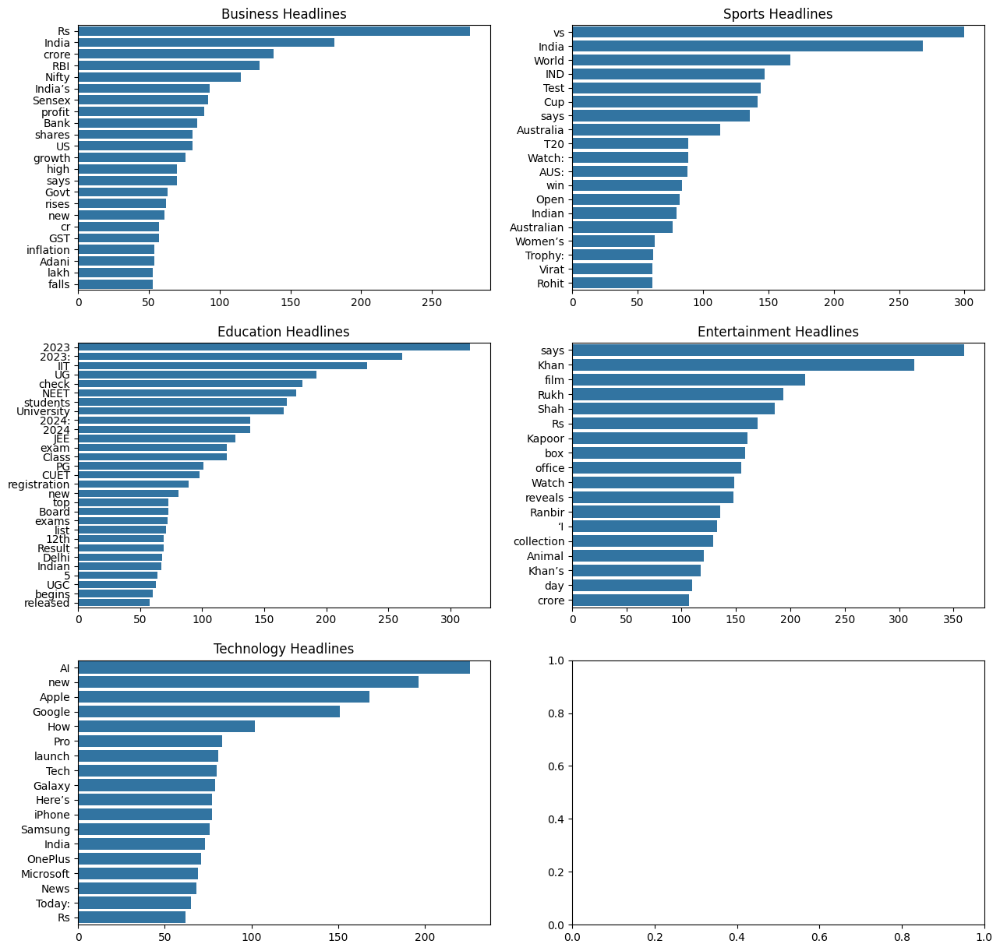

In [ ]:
import collections
from collections import Counter
from nltk.corpus import stopwords

def most_common_40_words(data):

    corpus=[]
    data_new = data['headlines'].str.split()
    data_new = data_new.values.tolist()
    corpus=[word for i in data_new for word in i]
    counter=Counter(corpus)
    most=counter.most_common()
    stop=set(stopwords.words('english'))
    x, y= [], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
    return x,y

business_x, business_y = most_common_40_words(business_data)
sports_x, sports_y = most_common_40_words(sports_data)
tech_x, tech_y = most_common_40_words(technology_data)
edu_x, edu_y = most_common_40_words(education_data)
entertain_x, entertain_y = most_common_40_words(entertainment_data)

fig, axs = plt.subplots(3, 2, figsize=(15,15))
sns.barplot(x=business_y,y=business_x, ax=axs[0,0])
axs[0, 0].set_title('Business Headlines')
sns.barplot(x=sports_y,y=sports_x, ax=axs[0,1])
axs[0, 1].set_title('Sports Headlines')
sns.barplot(x=edu_y,y=edu_x, ax=axs[1,0])
axs[1, 0].set_title('Education Headlines')
sns.barplot(x=entertain_y, y=entertain_x, ax=axs[1,1])
axs[1, 1].set_title('Entertainment Headlines')
sns.barplot(x=tech_y,y=tech_x, ax=axs[2,0])
axs[2, 0].set_title('Technology Headlines')


Text(0.5, 1.0, 'Technology Content')

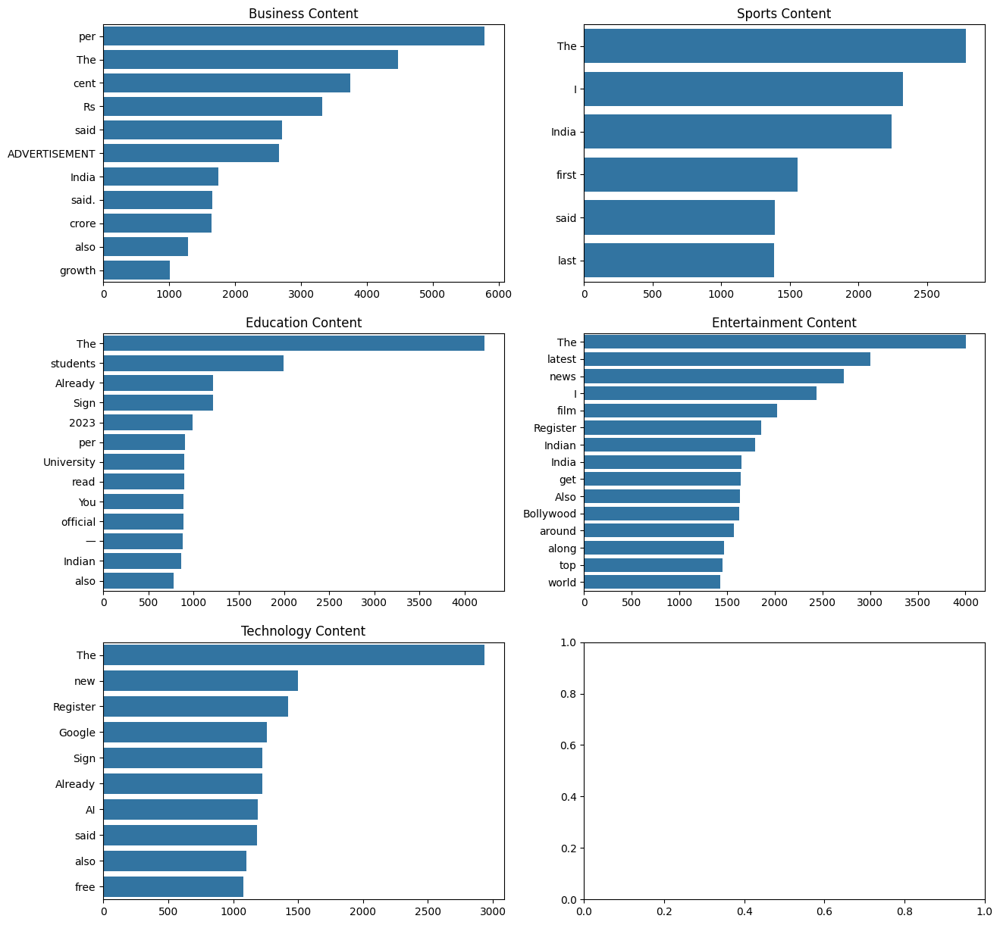

In [ ]:
import collections
from collections import Counter
from nltk.corpus import stopwords

def most_common_40_words(data):

    corpus=[]
    data_new = data['content'].str.split()
    data_new = data_new.values.tolist()
    corpus=[word for i in data_new for word in i]
    counter=Counter(corpus)
    most=counter.most_common()
    stop=set(stopwords.words('english'))
    x, y= [], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
    return x,y

business_x, business_y = most_common_40_words(business_data)
sports_x, sports_y = most_common_40_words(sports_data)
tech_x, tech_y = most_common_40_words(technology_data)
edu_x, edu_y = most_common_40_words(education_data)
entertain_x, entertain_y = most_common_40_words(entertainment_data)

fig, axs = plt.subplots(3, 2, figsize=(15,15))
sns.barplot(x=business_y,y=business_x, ax=axs[0,0])
axs[0, 0].set_title('Business Content')
sns.barplot(x=sports_y,y=sports_x, ax=axs[0,1])
axs[0, 1].set_title('Sports Content')
sns.barplot(x=edu_y,y=edu_x, ax=axs[1,0])
axs[1, 0].set_title('Education Content')
sns.barplot(x=entertain_y, y=entertain_x, ax=axs[1,1])
axs[1, 1].set_title('Entertainment Content')
sns.barplot(x=tech_y,y=tech_x, ax=axs[2,0])
axs[2, 0].set_title('Technology Content')


Text(0.5, 1.0, 'Technology Description')

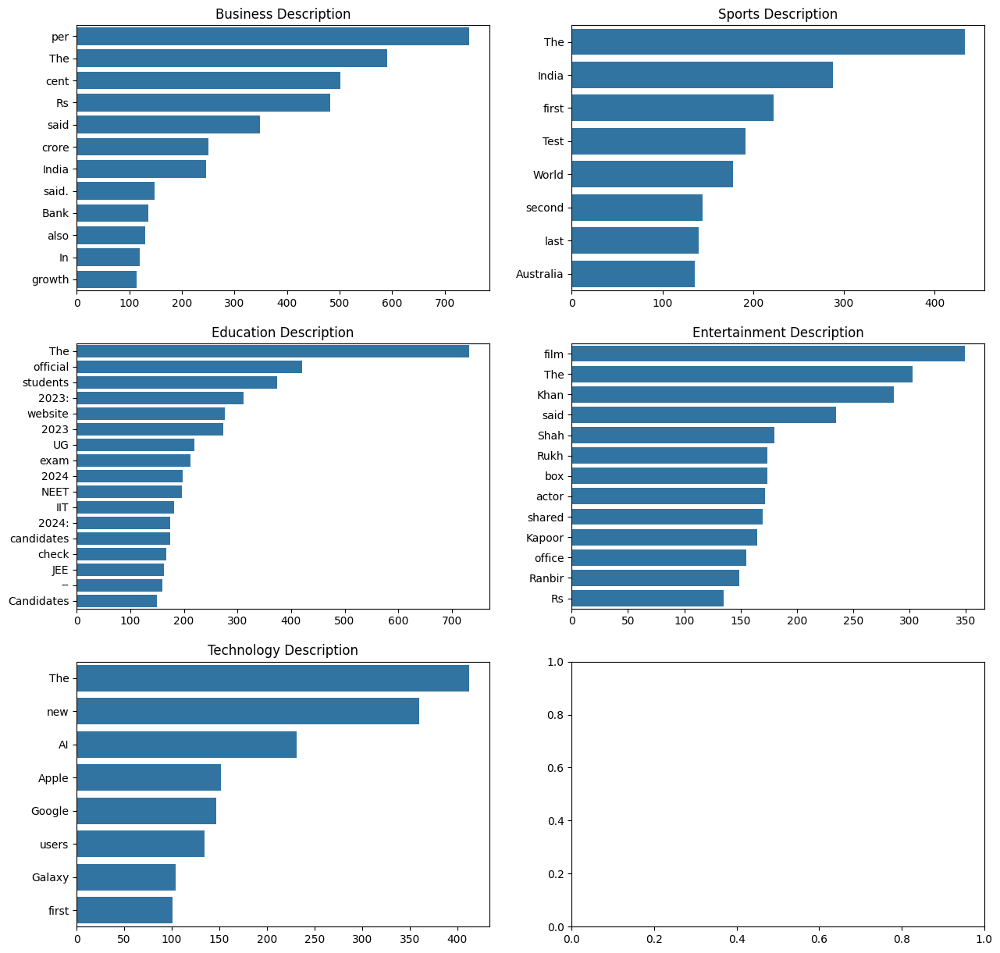

In [ ]:
import collections
from collections import Counter
from nltk.corpus import stopwords

def most_common_40_words(data):

    corpus=[]
    data_new = data['description'].str.split()
    data_new = data_new.values.tolist()
    corpus=[word for i in data_new for word in i]
    counter=Counter(corpus)
    most=counter.most_common()
    stop=set(stopwords.words('english'))
    x, y= [], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
    return x,y

business_x, business_y = most_common_40_words(business_data)
sports_x, sports_y = most_common_40_words(sports_data)
tech_x, tech_y = most_common_40_words(technology_data)
edu_x, edu_y = most_common_40_words(education_data)
entertain_x, entertain_y = most_common_40_words(entertainment_data)

fig, axs = plt.subplots(3, 2, figsize=(15,15))
sns.barplot(x=business_y,y=business_x, ax=axs[0,0])
axs[0, 0].set_title('Business Description')
sns.barplot(x=sports_y,y=sports_x, ax=axs[0,1])
axs[0, 1].set_title('Sports Description')
sns.barplot(x=edu_y,y=edu_x, ax=axs[1,0])
axs[1, 0].set_title('Education Description')
sns.barplot(x=entertain_y, y=entertain_x, ax=axs[1,1])
axs[1, 1].set_title('Entertainment Description')
sns.barplot(x=tech_y,y=tech_x, ax=axs[2,0])
axs[2, 0].set_title('Technology Description')


From above all plots, we can see top words in description and content are "The", "vs","said", "also" which needs to be removed by text pre-processing techniques.

## Bivariate Analysis

Since data features are text content, bivariate analysis is not explored.

### EDA Inferences

## Data Pre-Processing and Preparation for Modeling

### Duplicates Check

In [ ]:
# checking for duplicate values
print("Duplicates Check")
print("Business Data:"+str(business_data.duplicated().sum()))
print("Education Data:"+str(education_data.duplicated().sum()))
print("Entertainment Data:"+str(entertainment_data.duplicated().sum()))
print("Sports Data:"+str(sports_data.duplicated().sum()))
print("Technology Data:"+str(technology_data.duplicated().sum()))

Duplicates Check
Business Data:0
Education Data:0
Entertainment Data:0
Sports Data:0
Technology Data:0


In [ ]:
# Check duplicates column wise:
for column in news_data.columns:
    if column != 'Category':
        duplicates = news_data[column][news_data.duplicated(subset=[column], keep=False)]
        if not duplicates.empty:
            print(f"{len(duplicates)} Duplicate elements in column '{column}':")
            print(duplicates)
            print()

24 Duplicate elements in column 'headlines':
744                                                                               Japan launches antimonopoly probe into Google’s search dominance
2038                                                        International Education Day 2024: Know why it is celebrated on Jan 24, theme this year
2039                                                        International Education Day 2024: Know why it is celebrated on Jan 24, theme this year
2050                                                                      BSEB Bihar Board Exams: Inter admit card released; check how to download
2052                                                                      BSEB Bihar Board Exams: Inter admit card released; check how to download
2064                                               US Congress recognises Indian Americans and IIT graduates for contributions to American society
2066                                               US Congress recognises

There are total **duplicate values** in the dataset.

### Null Values/Missing Values Check

In [ ]:
#check null values across all features in training
print("Null Values Check")
print("Business Data:"+str(business_data.isnull().sum()))
print("Education Data:"+str(education_data.isnull().sum()))
print("Entertainment Data:"+str(entertainment_data.isnull().sum()))
print("Sports Data:"+str(sports_data.isnull().sum()))
print("Technology Data:"+str(technology_data.isnull().sum()))


We can see there is **0 null/NaN values in all categories.**

### Outlier Identification & Treatment

### New Variable Addition/Formation

Since all of our features are of text data, we can combine them into one feature to send for Text processing. For e.g. in below 5 categories,
1. headlines
2. content
3. description
4. url
5. category.

Since **url has information of category, url will not be used. Category is our target variable which will not be used.**

We create a **new feature named "mergetext" which is text merged from 3 features (content, headlines & description).**

In [ ]:
data_int=news_data.copy()
#Merge Content, description and title together into single column.
data_int['mergetext']=data_int['content']+" "+data_int['headlines']+" "+data_int['description']
data_int

From above few lines of data we can see **new feature mergetext has been added** to the dataset. Now we will do all the text processing on this new feature and will use it for final model training.

### Text Processing

-	Remove unwanted words in the text
-   Html tag removal.
-	Remove the numbers.
-	Tokenization.
-	Removal of Special Characters and Punctuations.
-	Conversion to lowercase.
-	Lemmatize or stemming.

**Remove unwanted words in the text**

From brief overview of the data and wordcloud for each feature, it seems to have repeative words/phrases like "Account", "Sign In", "Google", "Facebook", etc., So when we overviewed the data again, found some contents like below:
1. "Get easy access to the content you love with Express Lite. Now available with monthly payments.\nSubscribe Now\nAlready a subscriber? Sign in"
2. "You have exhausted your monthly limit of free stories.\nRegister to read more stories\nContinue With:-\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in"
3. ADVERTISEMENT

Let's check how many training samples has this type of data

In [ ]:
news_data[news_data.content.str.contains("Sign in")]

There are total **5061 training samples with this kind of dataset.**

More than half of the training samples have this. Let's check how many trainings samples have word "ADVERTISEMENT".

In [ ]:
news_data[news_data.content.str.contains("ADVERTISEMENT")]

There are total **2606 training samples with this kind of dataset**.

**26% of the training samples have word "ADVERTISEMENT"**. Let's try to remove these phrases or words.

In [ ]:
data_int['mergetext'] = data_int.mergetext.str.replace("\nGet easy access to the content you love with Express Lite. Now available with monthly payments.\nSubscribe Now\nAlready a subscriber? Sign in", "")
data_int['mergetext'] = data_int.mergetext.str.replace("\nYou have exhausted your monthly limit of free stories.\nRegister to read more stories\nContinue With:-\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nYou need a subscription to read this archive article.\nBUY NOW\nAlready a subscriber? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nThis story is subscriber only!\n\nNow subscribe at a special Republic Day offer of Rs 75/month.\nSubscribe Now\nAlready a subscriber? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nRegister to continue reading this story\nGoogle\nFacebook\nEmail\nAlready have an account? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nThis story is subscriber only!\n\nNow subscribe at a special discount of 15% Use Code: ELECTION15\nSubscribe Now\nAlready a subscriber? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nThis premium article is free for now..\nRegister to continue reading.\nRegister\nAlready have an account? Sign in\nClick for more updates and latest Bollywood news along with Entertainment updates. Also get latest news and top headlines from India and around the world at The Indian Express.","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nThis premium article is free for now..\nRegister to continue reading.\nRegister\nAlready have an account? Sign in","")
data_int['mergetext'] = data_int.mergetext.str.replace("\nADVERTISEMENT\n","")

print(data_int[data_int.mergetext.str.contains("Sign in")])
print(data_int[data_int.mergetext.str.contains("\nADVERTISEMENT\n")])

From above output we can see we have **removed unwanted text from mergetext feature.**

**Remove HTML Tags**

In [ ]:
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

data_int['cleantext'] = data_int['mergetext'].apply(lambda x: strip_html(x))


data_int.head()

HTML tags are removed, but couldn't able to see in last few rows.


**Replace contractions in string(e.g. replace I'm --> I am) and converting to lower cases.**

In [ ]:
import contractions

# creating an empty list
final_corpus = []

for i in range(news_data.shape[0]):
    # lowering the text
    review = data_int['cleantext'][i]

    review = review.lower()

    review = review.split()
    # using contractions.fix to expand the shortened words
    review = [contractions.fix(word) for word in review]
     # joining the corpus
    review = ' '.join(review)
    # Appending the result it into new list named final_corpus
    final_corpus.append(review)

In [ ]:
data_int["cleantext"]=final_corpus
data_int.tail()

**Remove numbers. special characters**

In [ ]:
final_corpus = []

for i in range(data_int.shape[0]):

    # removing the special characetrs, numbers from the data
    review = re.sub('[^a-zA-Z]', ' ', data_int['cleantext'][i])
    review = review.lower()

    # Appending the result it into new list named final_corpus

    final_corpus.append(review)

In [ ]:
#data_int=data.copy()
data_int["cleantext"]=final_corpus
data_int.head()

**Tokenization**

In [ ]:
data_int['cleantext'] = data_int.apply(lambda row: nltk.word_tokenize(row['cleantext']), axis=1) # Tokenization of data
data_int.tail()


**Remove Stopwords**

In [ ]:
stopwords = stopwords.words('english')

**Lemmatized data**

In [ ]:
lemmatizer = WordNetLemmatizer()

def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

def remove_stopwords(words):
    """Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stopwords:
            new_words.append(word)
    return new_words

def lemmatize_list(words):
    new_words = []
    for word in words:
      new_words.append(lemmatizer.lemmatize(word, pos='v'))
    return new_words

def normalize(words):
    words = remove_non_ascii(words)
    words = to_lowercase(words)
    words = remove_punctuation(words)
    words = remove_stopwords(words)
    words = lemmatize_list(words)
    return ' '.join(words)

data_int['cleantext'] = data_int.apply(lambda row: normalize(row['cleantext']), axis=1)

data_int.head()

headlines  \
0             Nirmala Sitharaman to equal Morarji Desai’s record with her sixth straight budget   
1      ‘Will densify network, want to be at least no. 2 in any city pair’: Air India Express MD   
2                     Air India group to induct an aircraft every six days throughout this year   
3                      Red Sea woes: Exporters seek increased credit as freight rates jump 300%   
4  Air India group to induct a plane every 6 days throughout 2024; kick off legacy fleet revamp   

                                                                                                                                                                                                                                 description  \
0  With the presentation of the interim budget on February 1, Nirmala Sitharaman will surpass the records of her predecessors like Manmohan Singh, Arun Jaitley, P Chidambaram, and Yashwant Sinha, who had presented five budgets in a row.   
1                                          'In terms of market share, we aim to double it by 2028 in both segments—15 per cent in the domestic and 20 per cent in short-haul international,' says AI Express’s Managing Director Aloke Singh   
2    Air India currently has 117 operational aircraft in its fleet, while its arm Air India Express has 63 planes. Under the new owners, Air India has been able to bring back to service 90 per cent of its long-grounded aircraft as well.   
3                                                                                                                                                                                Rising attacks forced shippers to consider the longer route   
4                                                                                            Apart from fleet expansion, 2024 will also see Air India kick off the full interior refit of 40 legacy wide-body aircraft—Boeing 777s and 787s.   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [ ]:
# saving the cleaned text back to text column
news_data['cleantext'] = data_int['cleantext']

In [ ]:
news_data.tail(20)

Now all the text processing has been done and data is ready for Model Building. Final feature **cleantext** will be used to build the model.

## Extensive Exploratory Analysis

Let's **check the data, wordcloud post text processing using cleantext** feature

In [ ]:
news_data.info()

There are total **10000 files with 6 columns now with extra 1 column cleantext.** **All features are of non-null and object data type**.

In [ ]:
news_data.describe(include="all").T

From above descriptive statistics we can see:
1. Though all other features has repeatative values, **cleantext has unique samples.**
2. This is due to addition of 3 features (content, description & headlines) into a single feature.

Let's verify this by checking if there are any duplicates in the dataset.


In [ ]:
# checking for duplicate values
print("Duplicates Check")
print("News Data:"+str(news_data.duplicated().sum()))


Duplicates Check
News Data:0


As expected, there are **no duplicates in the news_data**

In [ ]:
#checking duplicate values in cleantext column
print("Duplicates Check")
print("News Data:"+str(news_data.cleantext.duplicated().sum()))
news_data[news_data.cleantext.duplicated()]

Duplicates Check
News Data:0


,headlines,description,content,url,category,cleantext


There is **one duplicate element in the cleantext** column. Removing the duplicates.

In [ ]:
news_data.drop_duplicates(subset='cleantext', keep="last",inplace=True)

Let's check if there are any null values post text processing

In [ ]:
#check null values across all features in training
print("Null Values Check")
print("News Data:"+str(news_data.isnull().sum()))


Null Values Check
News Data:headlines      0
description    0
content        0
url            0
category       0
cleantext      0
dtype: int64


We can see there are **0 null/NaN values in all the columns especially cleantext** column which will be used for model building.

### Word Cloud using CleanText column for each category

Now, Let's check wordcloud information for each category using cleantext column

In [ ]:
# Creating word cloud using CleanText feature for each category
business_category = news_data[news_data['category'] == "business"]
education_category = news_data[news_data['category'] == "education"]
sports_category = news_data[news_data['category'] == "sports"]
entertainment_category = news_data[news_data['category'] == "entertainment"]
technology_category = news_data[news_data['category'] == "technology"]


business_cleantext_words = ' '.join(business_category['cleantext'])
sports_cleantext_words = ' '.join(sports_category['cleantext'])
entertainement_cleantext_words = ' '.join(entertainment_category['cleantext'])
education_cleantext_words = ' '.join(education_category['cleantext'])
technology_cleantext_words = ' '.join(technology_category['cleantext'])


cleaned_business_word = " ".join([word for word in business_cleantext_words.split()])
cleaned_sports_word = " ".join([word for word in sports_cleantext_words.split()])
cleaned_education_word = " ".join([word for word in education_cleantext_words.split()])
cleaned_entertainment_word = " ".join([word for word in entertainement_cleantext_words.split()])
cleaned_technology_word = " ".join([word for word in technology_cleantext_words.split()])


In [ ]:
business_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_business_word)
sports_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_sports_word)
education_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'white',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_education_word)
entertainment_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_entertainment_word)
technology_wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = 'black',
                      width = 3000,
                      height = 2500
                     ).generate(cleaned_technology_word)


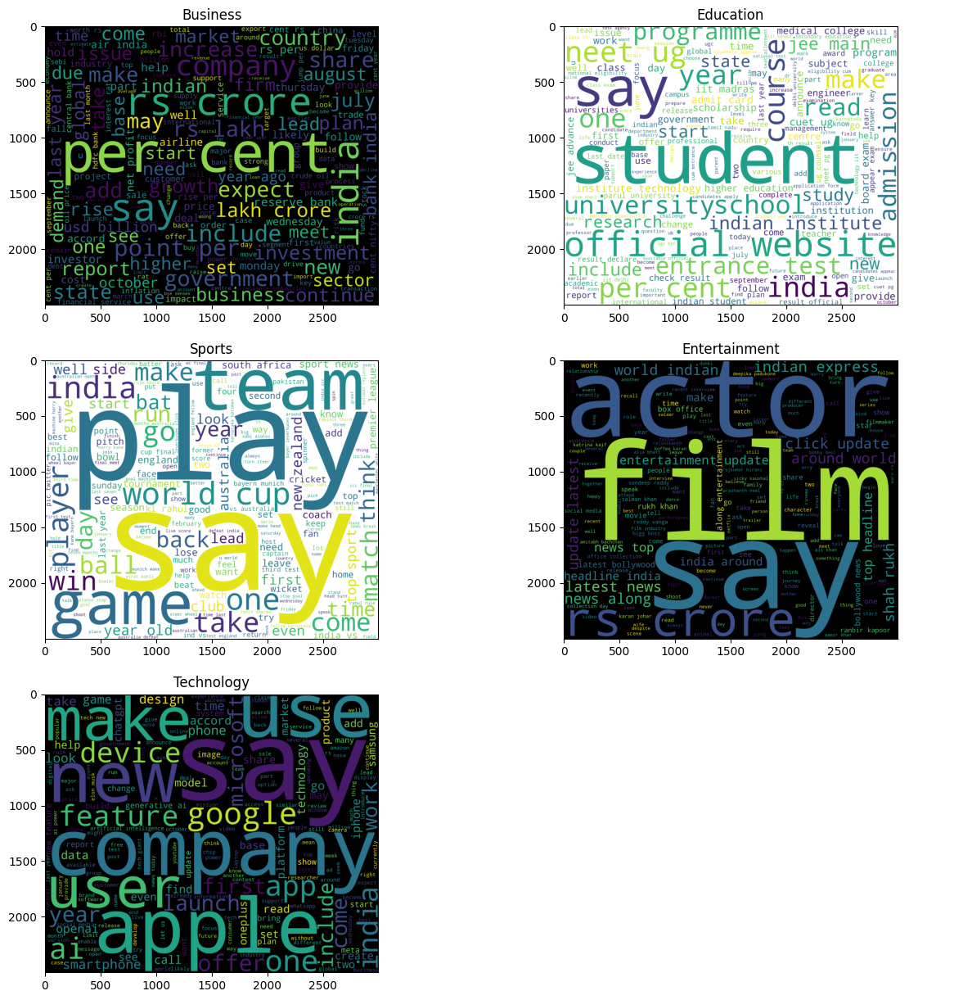

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15,15))
axs[0, 0].imshow(business_wordcloud)
axs[0, 0].set_title('Business')
axs[0, 1].imshow(education_wordcloud)
axs[0, 1].set_title('Education')
axs[1, 0].imshow(sports_wordcloud)
axs[1, 0].set_title('Sports')
axs[1, 1].imshow(entertainment_wordcloud)
axs[1, 1].set_title('Entertainment')
axs[2, 0].imshow(technology_wordcloud)
axs[2, 0].set_title("Technology")

plt.axis('off')

plt.show()

## Text Character Frequency Analysis

Let's explore text character frequency Analysis for "cleantext" column

array([[<Axes: title={'center': 'Business Final Text'}>,
        <Axes: title={'center': 'Sports Final Text'}>],
       [<Axes: title={'center': 'Education Final Text'}>,
        <Axes: title={'center': 'Entertainment Final Text'}>],
       [<Axes: title={'center': 'Technology Final Text'}>, <Axes: >]],
      dtype=object)

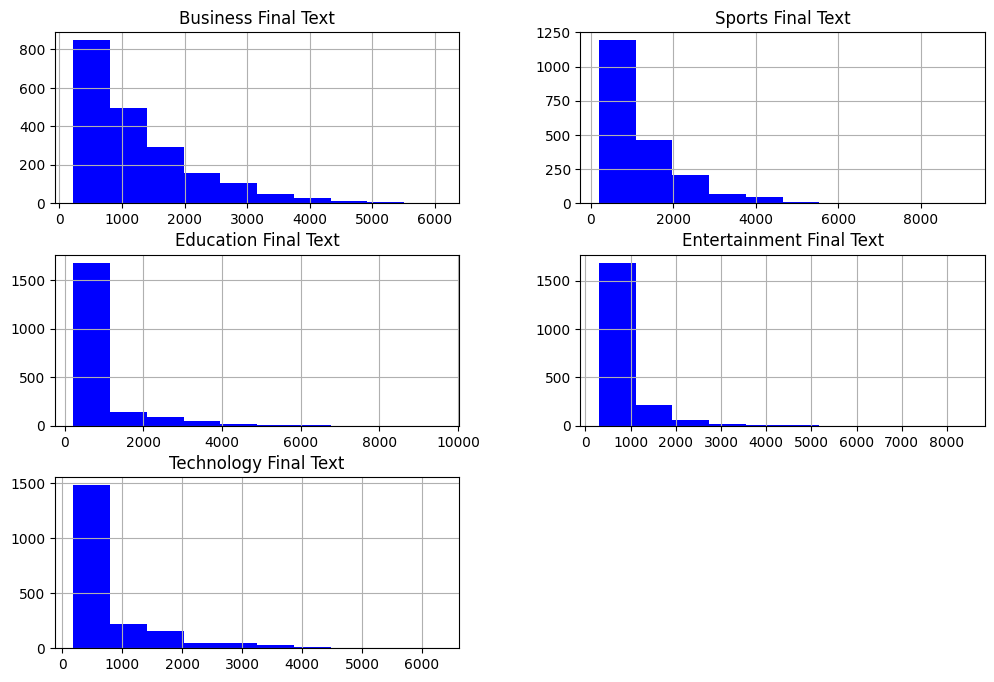

In [ ]:
# For Description Feature of all category
business_data_processed = news_data[news_data['category'] == "business"]
sports_data_processed = news_data[news_data['category'] == "sports"]
entertainment_data_processed = news_data[news_data['category'] == "entertainment"]
education_data_processed = news_data[news_data['category'] == "education"]
technology_data_processed = news_data[news_data['category'] == "technology"]

all_cleantext = pd.DataFrame({ "Business Final Text":  business_data_processed['cleantext'].str.len(), "Sports Final Text":  sports_data_processed['cleantext'].str.len(),
                                "Education Final Text": education_data_processed['cleantext'].str.len(), "Entertainment Final Text": entertainment_data_processed['cleantext'].str.len(),
                                "Technology Final Text": technology_data_processed['cleantext'].str.len()})
all_cleantext.hist(figsize=(12,8), color='Blue')



## Word Count Analysis

array([[<Axes: title={'center': 'Business Final Text'}>,
        <Axes: title={'center': 'Sports Final Text'}>],
       [<Axes: title={'center': 'Education Final Text'}>,
        <Axes: title={'center': 'Entertainment Final Text'}>],
       [<Axes: title={'center': 'Technology Final Text'}>, <Axes: >]],
      dtype=object)

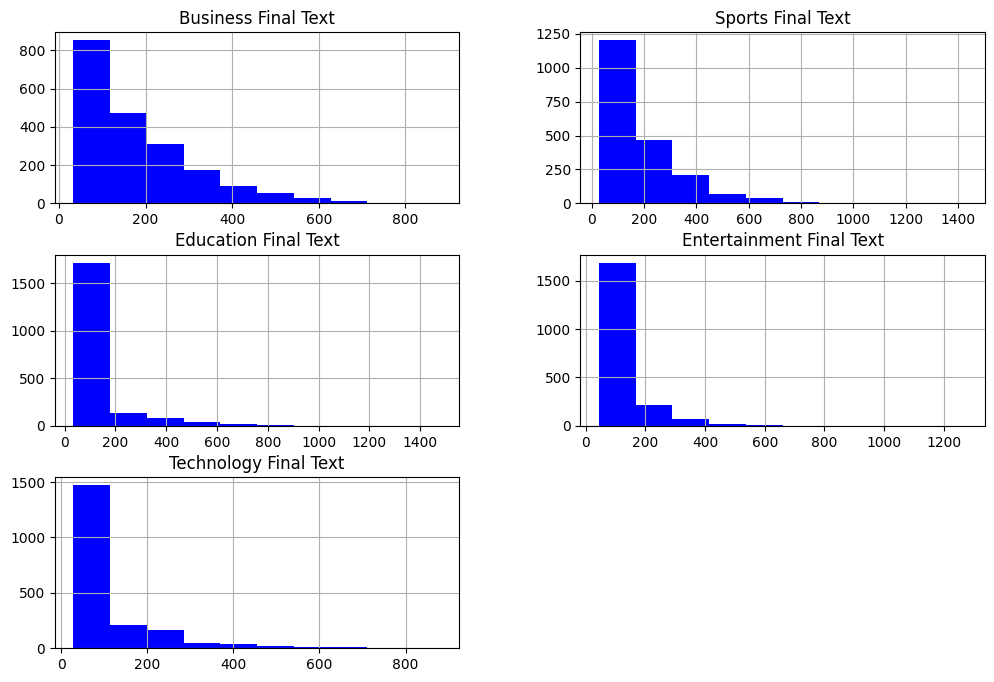

In [ ]:
# For Description Feature of all category
business_data_processed = news_data[news_data['category'] == "business"]
sports_data_processed = news_data[news_data['category'] == "sports"]
entertainment_data_processed = news_data[news_data['category'] == "entertainment"]
education_data_processed = news_data[news_data['category'] == "education"]
technology_data_processed = news_data[news_data['category'] == "technology"]

all_cleantext = pd.DataFrame({ "Business Final Text":  business_data_processed['cleantext'].str.split().map(lambda x: len(x)), "Sports Final Text":  sports_data_processed['cleantext'].str.split().map(lambda x: len(x)),
                                "Education Final Text": education_data_processed['cleantext'].str.split().map(lambda x: len(x)), "Entertainment Final Text": entertainment_data_processed['cleantext'].str.split().map(lambda x: len(x)),
                                "Technology Final Text": technology_data_processed['cleantext'].str.split().map(lambda x: len(x))})
all_cleantext.hist(figsize=(12,8), color='Blue')



## Average Word Length Analysis

array([[<Axes: title={'center': 'Business Final Text'}>,
        <Axes: title={'center': 'Sports Final Text'}>],
       [<Axes: title={'center': 'Education Final Text'}>,
        <Axes: title={'center': 'Entertainment Final Text'}>],
       [<Axes: title={'center': 'Technology Final Text'}>, <Axes: >]],
      dtype=object)

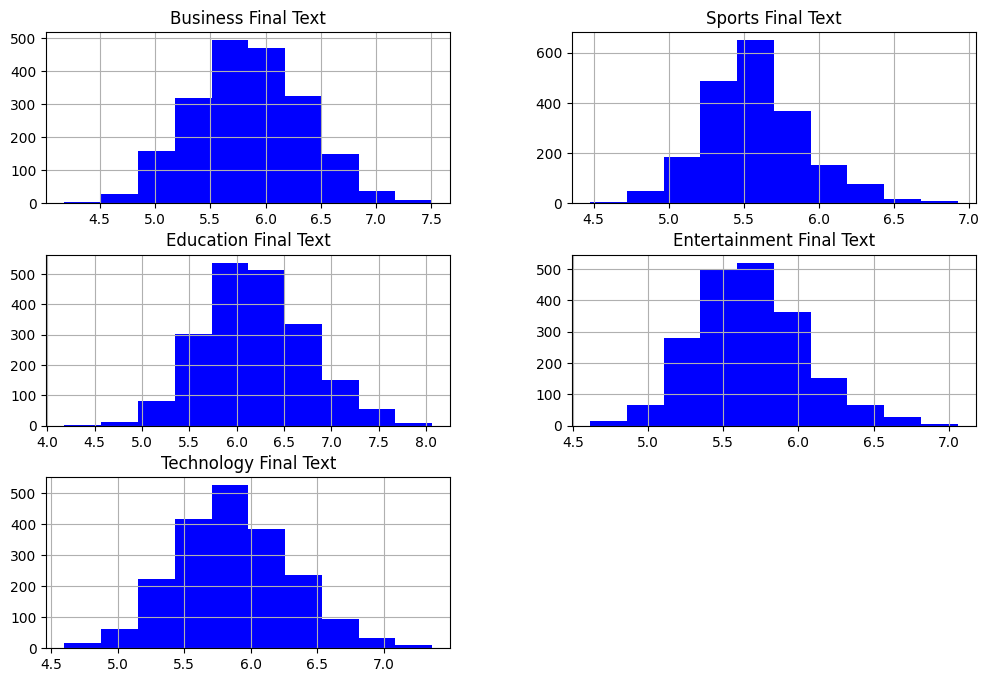

In [ ]:
# For Cleantext Feature of all category - Analyzing average wordlength
business_data_processed = news_data[news_data['category'] == "business"]
sports_data_processed = news_data[news_data['category'] == "sports"]
entertainment_data_processed = news_data[news_data['category'] == "entertainment"]
education_data_processed = news_data[news_data['category'] == "education"]
technology_data_processed = news_data[news_data['category'] == "technology"]

all_cleantext = pd.DataFrame({ "Business Final Text":  business_data_processed['cleantext'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Sports Final Text":  sports_data_processed['cleantext'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Education Final Text": education_data_processed['cleantext'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)), "Entertainment Final Text": entertainment_data_processed['cleantext'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)),
                                "Technology Final Text": technology_data_processed['cleantext'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))})
all_cleantext.hist(figsize=(12,8), color='Blue')


#text.str.split().map(lambda x: len(x)).hist()
#split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x)).hist()

## Frequent Word Analysis

Text(0.5, 1.0, 'Technology Final Text')

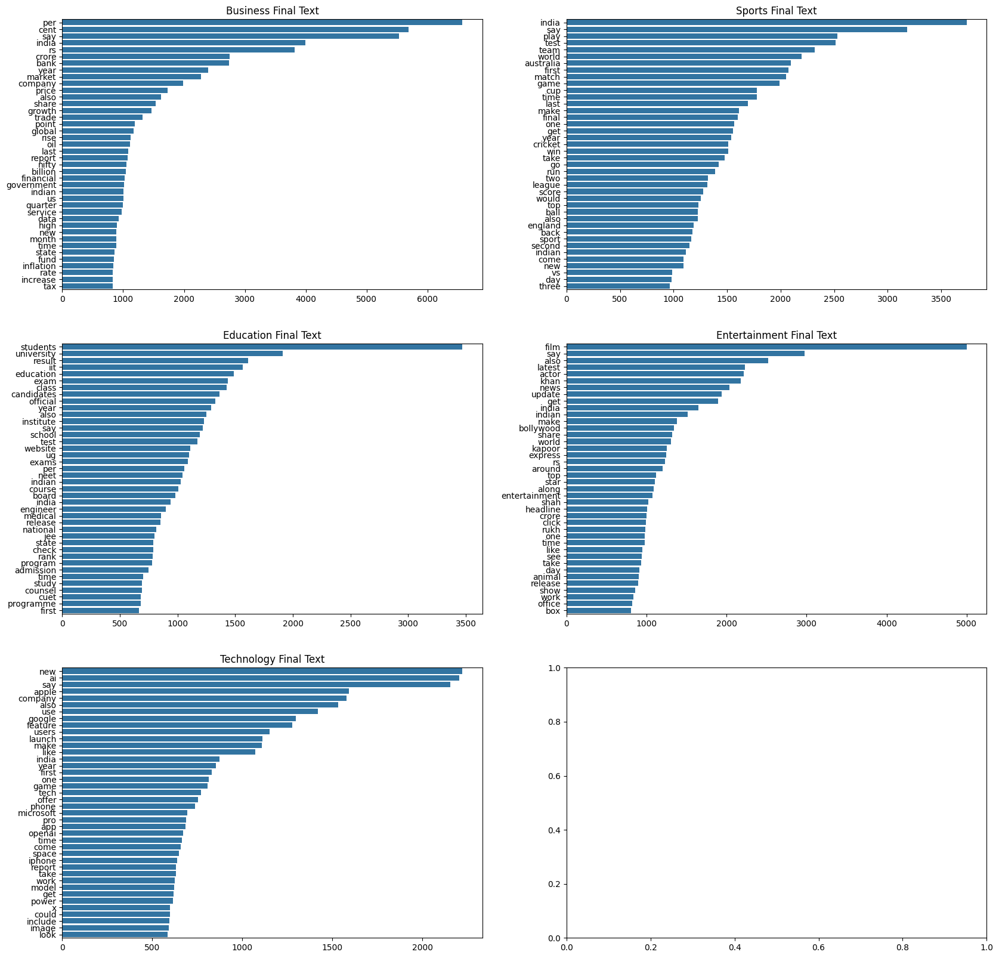

In [ ]:
import collections
from collections import Counter
from nltk.corpus import stopwords

business_data_processed = news_data[news_data['category'] == "business"]
sports_data_processed = news_data[news_data['category'] == "sports"]
entertainment_data_processed = news_data[news_data['category'] == "entertainment"]
education_data_processed = news_data[news_data['category'] == "education"]
technology_data_processed = news_data[news_data['category'] == "technology"]
def most_common_40_words(data):

    corpus=[]
    data_new = data['cleantext'].str.split()
    data_new = data_new.values.tolist()
    corpus=[word for i in data_new for word in i]
    counter=Counter(corpus)
    most=counter.most_common()
    stop=set(stopwords.words('english'))
    x, y= [], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
    return x,y

business_x, business_y = most_common_40_words(business_data_processed)
sports_x, sports_y = most_common_40_words(sports_data_processed)
tech_x, tech_y = most_common_40_words(technology_data_processed)
edu_x, edu_y = most_common_40_words(education_data_processed)
entertain_x, entertain_y = most_common_40_words(entertainment_data_processed)

fig, axs = plt.subplots(3, 2, figsize=(20,20))
sns.barplot(x=business_y,y=business_x, ax=axs[0,0])
axs[0, 0].set_title('Business Final Text')
sns.barplot(x=sports_y,y=sports_x, ax=axs[0,1])
axs[0, 1].set_title('Sports Final Text')
sns.barplot(x=edu_y,y=edu_x, ax=axs[1,0])
axs[1, 0].set_title('Education Final Text')
sns.barplot(x=entertain_y, y=entertain_x, ax=axs[1,1])
axs[1, 1].set_title('Entertainment Final Text')
sns.barplot(x=tech_y,y=tech_x, ax=axs[2,0])
axs[2, 0].set_title('Technology Final Text')


## Count Vectorization, TF-IDF Vectorization and Baseline Model Building

In this report we will show **baseline model building using RandomForest Classifier and CountVectorizer & TF-IDF Vectorization.**  More detailed Model Analysis will be done in Milestone report 2.

### Using countvectorizer

- Intialize countvectorizer and use it for vectorization
- Store Independent and Dependent variables
- Split the data into train and test
- Build a Random Forest model on train data
- Use Cross validation to validate the score and to find optimal n_estimators
- Plot the misclassification error for each of estimators
- Test the model on testing data
- Plot the Confusion matrix
plot word cloud for top 40 important features obtained from Count vectorizer and random forest model


First let's **split the data in train and test so that data leakage doesn't occur during training process.** We take only **cleantext** as our text feature to be passed to CountVectorizer.

In [ ]:
# Split data into training and testing set.
X = news_data.cleantext
y = news_data.category
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, shuffle = True, random_state=297)

In [ ]:
# Vectorization (Convert text data to numbers).
from sklearn.feature_extraction.text import CountVectorizer

# Keep only 100 features as number of features will increase the processing time.
Count_vec = CountVectorizer(max_features = 1000)

X_train_data_features = Count_vec.fit_transform(X_train) #news_data['cleantext'])

# Convert the data features to array
X_train_data_features = X_train_data_features.toarray()

In [ ]:
# Shape of the feature vector
X_train_data_features.shape

(7499, 1000)

Taken **75% of data for training** and **25% of data for testing**. **Max feature count for CountVectorizer is set to 1000.**

In [ ]:
# Function to print the classification report and get confusion matrix in a proper format

def metrics_score(actual, predicted):

    print(classification_report(actual, predicted))

    cm = confusion_matrix(actual, predicted)

    plt.figure(figsize = (8, 5))

    sns.heatmap(cm, annot = True,  fmt = '.2f', xticklabels = ['Business', 'Education','Entertainment', 'Sports', 'Technology'], yticklabels = ['Business', 'Education', 'Entertainment', 'Sports', 'Technology'])

    plt.ylabel('Actual')

    plt.xlabel('Predicted')

    plt.show()

In [ ]:
# Training the best model and calculating accuracy on test data

clf = RandomForestClassifier(n_estimators = 100,random_state=571)

clf.fit(X_train_data_features, y_train)

print(np.mean(cross_val_score(clf, X_train_data_features, y_train, cv=10)))

0.9574611481975968


**Cross Validation performance of CountVectorizer + RandomForestClassifier is: 95.57%**

### Test Set Performance - Count Vectorizer

               precision    recall  f1-score   support

     business       0.94      0.94      0.94       509
    education       0.96      0.98      0.97       502
entertainment       0.99      0.96      0.97       515
       sports       0.95      0.99      0.97       476
   technology       0.93      0.91      0.92       498

     accuracy                           0.95      2500
    macro avg       0.95      0.95      0.95      2500
 weighted avg       0.95      0.95      0.95      2500



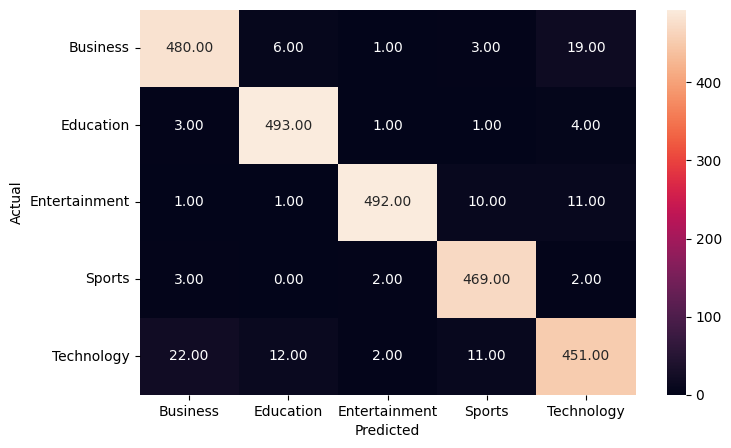

In [ ]:
X_test_data_features = Count_vec.transform(X_test) #news_data['cleantext'])

# Convert the data features to array
X_test_data_features = X_test_data_features.toarray()
y_pred_test = clf.predict(X_test_data_features)

metrics_score(y_test, y_pred_test)

### Get Top50 Words from CountVectorizer

In [ ]:
def get_top50_words(model, all_features):

    # Addition of top 20 feature into top_feature after training the model
    top_features=''

    feat = model.feature_importances_

    features = np.argsort(feat)[::-1]

    for i in features[0:50]:
        top_features+=all_features[i]
        top_features+=','
    print("Top 50 features:"+str(top_features)+"\n\n")
    from wordcloud import WordCloud

    wordcloud = WordCloud(background_color = "white", colormap = 'viridis', width = 2000,
                              height = 1000).generate(top_features)

    # Display the generated image:
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.figure(1, figsize = (14, 11), frameon='equal')
    plt.title('Top 50 features WordCloud', fontsize = 10)
    plt.axis("off")
    plt.show()

Top 50 features:film,actor,students,education,match,institute,exam,cent,bollywood,entertainment,candidates,per,bank,company,cup,users,australia,ai,team,india,win,headline,website,market,university,sport,feature,cricket,khan,crore,update,say,entrance,league,iit,latest,apple,news,play,vs,click,express,test,official,exams,along,use,star,score,trade,




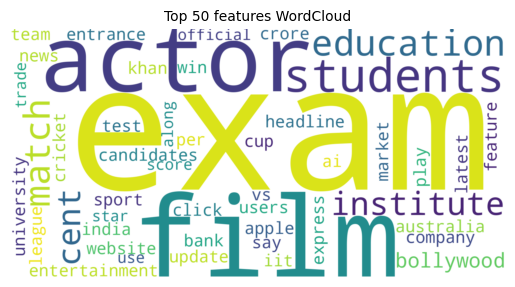

In [ ]:
 #Instantiate the feature from the vectorizer

features = Count_vec.get_feature_names_out()

get_top50_words(clf,features)

### Using TF-IDF (Term Frequency- Inverse Document Frequency)

In [ ]:
# Using TfidfVectorizer to convert text data to numbers.

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vect = TfidfVectorizer(max_features = 1000)

X_train_data_features_tfidf = tfidf_vect.fit_transform(X_train)

X_train_data_features_tfidf = X_train_data_features_tfidf.toarray()

# Feature shape
X_train_data_features_tfidf.shape

(7499, 1000)

In [ ]:
# Training the best model and calculating accuracy on test data

clf_tfidf = RandomForestClassifier(n_estimators = 100,random_state=571)

clf_tfidf.fit(X_train_data_features_tfidf, y_train)

print(np.mean(cross_val_score(clf_tfidf, X_train_data_features_tfidf, y_train, cv=10)))

0.9557278148642634


### Test Performance using TF-IDF Vectorization + Random Forest Classifier

               precision    recall  f1-score   support

     business       0.94      0.94      0.94       509
    education       0.96      0.98      0.97       502
entertainment       0.99      0.96      0.97       515
       sports       0.96      0.99      0.97       476
   technology       0.92      0.90      0.91       498

     accuracy                           0.95      2500
    macro avg       0.95      0.95      0.95      2500
 weighted avg       0.95      0.95      0.95      2500



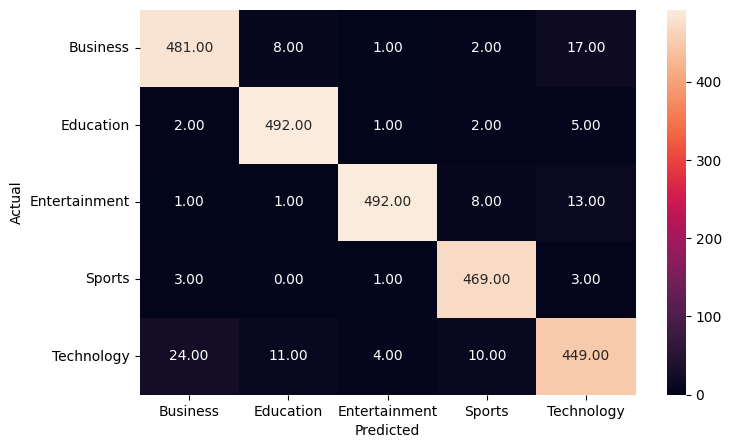

In [ ]:
X_test_data_features_tfidf = tfidf_vect.transform(X_test) #news_data['cleantext'])

# Convert the data features to array
X_test_data_features_tfidf = X_test_data_features_tfidf.toarray()
y_pred_test_tfidf = clf_tfidf.predict(X_test_data_features_tfidf)

metrics_score(y_test, y_pred_test_tfidf)

### Get Top50 Words from CountVectorizer

Top 50 features:film,actor,students,match,education,institute,exam,cent,bollywood,bank,users,entertainment,per,company,candidates,team,australia,cup,win,ai,india,website,university,market,sport,headline,crore,along,cricket,iit,khan,league,latest,entrance,feature,play,apple,say,click,official,use,vs,class,test,news,update,express,new,game,launch,




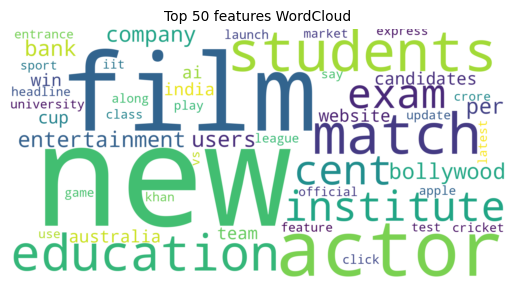

In [ ]:
 #Instantiate the feature from the vectorizer

features_tfidf = tfidf_vect.get_feature_names_out()

get_top50_words(clf_tfidf,features_tfidf)

## Summary

---



## Happy Learning!